# DerivKit Benchmark Notebook

## Introduction

This notebook demonstrates the performance and reliability of derivative estimation methods implemented in the `derivkit` package. We focus on two aspects:

- **Speed**: Comparing runtime performance between the STEM method and the five-point stencil method.
- **Stability**: Evaluating numerical accuracy across a broad range of mathematical functions.

Both methods are tested using synthetic functions with known derivatives to visualize accuracy and residuals.


In [1]:
import time
from time import perf_counter

import numpy as np
import matplotlib.pyplot as plt

from derivkit import HybridDerivativeCalculator


## Speed Test: STEM vs Five-Point Stencil

We compare the computational runtime of both methods on a computationally expensive function, simulating realistic usage where function evaluations are costly.


In [2]:
# Define the slow function
def slow_function(x, time_sleep):
    time.sleep(time_sleep)
    return np.sin(x**2) * np.exp(-x**2) + np.log(1 + x**2)

# Wrapper for fixed x
def make_slow_func(sleep_time):
    return lambda x: slow_function(x, sleep_time)

# Evaluation times to test (in seconds)
sleep_times = [0.01] + [round(x, 2) for x in np.arange(0.25, 2.01, 0.25)]

# Store results
timings = {"stem": [], "stencil": []}

for t_sleep in sleep_times:
    f = make_slow_func(t_sleep)
    calc = HybridDerivativeCalculator(f, central_value=0.0005, derivative_order=2)

    # Stem method timing
    start = perf_counter()
    _ = calc.stem_method()
    timings["stem"].append(perf_counter() - start)

    # Stencil method timing
    start = perf_counter()
    _ = calc.five_point_stencil_method()
    timings["stencil"].append(perf_counter() - start)


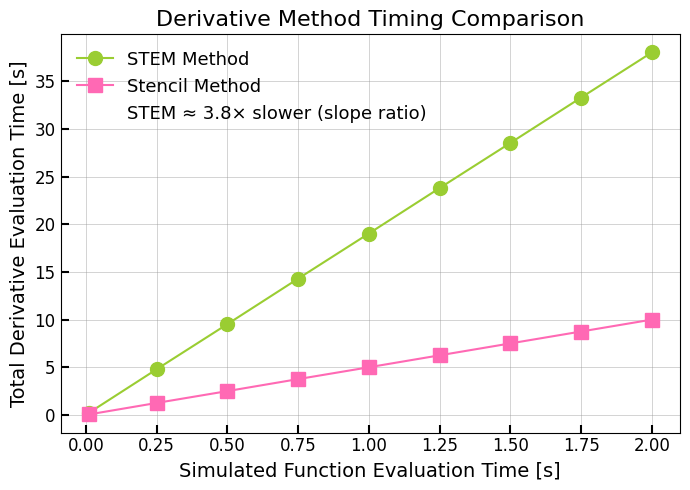

In [3]:
# Estimate the slowdown ratio between STEM and stencil methods
x = np.array(sleep_times)
stem = np.array(timings["stem"])
stencil = np.array(timings["stencil"])

# Approximate linear slowdown: fit y = a*x + b to STEM and stencil
a_stem, b_stem = np.polyfit(x, stem, 1)
a_stencil, b_stencil = np.polyfit(x, stencil, 1)

# Estimated average slowdown: ratio of linear slopes
slope_ratio = a_stem / a_stencil
slowdown_note = f"STEM ≈ {slope_ratio:.1f}× slower (slope ratio)"

# Plotting
plt.figure(figsize=(7, 5))
plt.plot(sleep_times, timings["stem"], 'o-', c="yellowgreen", markersize=10, label='STEM Method')
plt.plot(sleep_times, timings["stencil"], 's-', c="hotpink", markersize=10, label='Stencil Method')

plt.xlabel("Simulated Function Evaluation Time [s]", fontsize=14)
plt.ylabel("Total Derivative Evaluation Time [s]", fontsize=14)
plt.title("Derivative Method Timing Comparison", fontsize=16)

plt.plot([], [], ' ', label=slowdown_note)  # dummy invisible plot
plt.legend(fontsize=13, frameon=False)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Ticks inward for both major and minor
plt.tick_params(axis='both', which='both', direction='in', length=6, width=1.5)

# Grid setup
plt.grid(True, which='major', color='#999999', linestyle='-', linewidth=0.5, alpha=0.6)
# plt.minorticks_on()
# plt.grid(True, which='minor', linestyle=':', linewidth=0.3, alpha=0.4)

plt.tight_layout()
plt.savefig("plots/benchmark_stem_stencil_timing.png")
plt.show()


## Stability Test: Accuracy Across Functions

We assess numerical accuracy by comparing derivative estimates from the STEM and five-point stencil methods across a diverse suite of mathematical functions. Residuals and relative differences are tracked and visualized.


In [4]:
# First let us define the test cases: some simple, some complicated functions

test_functions = [
    {"name": "x^2", "func": lambda x: x**2},
    {"name": "x^3", "func": lambda x: x**3},
    {"name": "sin(x)", "func": lambda x: np.sin(x)},
    {"name": "cos(x)", "func": lambda x: np.cos(x)},
    {"name": "tan(x)", "func": lambda x: np.tan(x)},
    {"name": "exp(x)", "func": lambda x: np.exp(x)},
    {"name": "ln(x + 2)", "func": lambda x: np.log(x + 2)},
    {"name": "sqrt(x + 1)", "func": lambda x: np.sqrt(x + 1)},
    {"name": "1 / (1 + x^2)", "func": lambda x: 1 / (1 + x**2)},
    {"name": "x * sin(x)", "func": lambda x: x * np.sin(x)},
    {"name": "x^2 * cos(x)", "func": lambda x: x**2 * np.cos(x)},
    {"name": "x * exp(-x^2)", "func": lambda x: x * np.exp(-x**2)},
    {"name": "exp(-x^2) * sin(5x)", "func": lambda x: np.exp(-x**2) * np.sin(5 * x)},
    {"name": "log(1 + x^2) * sin(x)", "func": lambda x: np.log(1 + x**2) * np.sin(x)},
    {"name": "sin(x) * cos(x)", "func": lambda x: np.sin(x) * np.cos(x)},
    {"name": "abs(x)", "func": lambda x: np.abs(x)},
    {"name": "Piecewise (x^2 / sqrt(x+1))", "func": lambda x: x**2 if x < 0 else np.sqrt(x + 1)},
    {"name": "Piecewise sin or cos", "func": lambda x: np.sin(x) if x < 1 else np.cos(x)},
    {"name": "ReLU", "func": lambda x: max(0, x)},
    {"name": "x * |x|", "func": lambda x: x * abs(x)},
    {"name": "Heaviside(x)", "func": lambda x: 0 if x < 0 else 1},
    {"name": "sin(x^2)", "func": lambda x: np.sin(x**2)},
    {"name": "exp(sin(x))", "func": lambda x: np.exp(np.sin(x))},
    {"name": "log(cos(x)^2 + 1)", "func": lambda x: np.log(np.cos(x)**2 + 1)},
    {"name": "weird combo", "func": lambda x: x**3 * np.cos(x**2) + np.exp(-x**2)},

    # Extra complicated functions
    {"name": "log(|sin(x)| + 1)", "func": lambda x: np.log(np.abs(np.sin(x)) + 1)},
    {"name": "exp(-x^2) * cos(10x)", "func": lambda x: np.exp(-x**2) * np.cos(10 * x)},
    {"name": "arctan(exp(x))", "func": lambda x: np.arctan(np.exp(x))},
    {"name": "nested trig log", "func": lambda x: np.log(np.abs(np.sin(x)) + 1e-3)},
    {"name": "sqrt(sin^2(x) + cos^2(x))", "func": lambda x: np.sqrt(np.sin(x)**2 + np.cos(x)**2)},
    {"name": "sigmoid", "func": lambda x: 1 / (1 + np.exp(-x))},
    {"name": "softplus", "func": lambda x: np.log(1 + np.exp(x))},
    {"name": "x * tanh(x)", "func": lambda x: x * np.tanh(x)},
    {"name": "gaussian bump", "func": lambda x: np.exp(-1 / (1 - x**2)) if abs(x) < 1 else 0},
    {"name": "x^x (safe)", "func": lambda x: x**x if x > 0 else 0},
    {"name": "sin(exp(x))", "func": lambda x: np.sin(np.exp(x))},
    {"name": "cos(sin(x^2))", "func": lambda x: np.cos(np.sin(x**2))},
    {"name": "sinc(x)", "func": lambda x: np.sinc(x / np.pi)},  # normalized sinc
]

In [5]:
%%time

def run_tests(test_cases):

    x_vals = [-16, -5, 0.0, 0.5, 3.6]
    print("\n=== DERIVATIVE TEST RESULTS ===\n")

    for case in test_cases:
        print(f"Function: {case['name']}")
        for x in x_vals:
            try:
                hdc = HybridDerivativeCalculator(case["func"], x, derivative_order=2, log_suffix="run")
                stem = hdc.stem_method()
                stencil = hdc.five_point_stencil_method()
                abs_diff = abs(stem - stencil)
                rel_diff = abs_diff / (abs(stencil) + 1e-12)

                print(f"  @ x = {x:>5.1f} | Stem: {stem:>10.6f} | Stencil: {stencil:>10.6f} | Δ: {abs_diff:>8.2e} | Rel Δ: {rel_diff:>6.2e}", end="")
                if rel_diff > 0.05:
                    print("  ⚠️")
                else:
                    print("  ✅")
            except Exception as e:
                print(f"  @ x = {x:>5.1f} → ❌ Error: {str(e)}")
        print("-" * 80)

if __name__ == "__main__":
    run_tests(test_cases=test_functions)



=== DERIVATIVE TEST RESULTS ===

Function: x^2
  @ x = -16.0 | Stem:   2.000000 | Stencil:   2.000000 | Δ: 1.08e-09 | Rel Δ: 5.38e-10  ✅
  @ x =  -5.0 | Stem:   2.000000 | Stencil:   2.000000 | Δ: 5.82e-11 | Rel Δ: 2.91e-11  ✅
  @ x =   0.0 | Stem:   2.000000 | Stencil:   2.000000 | Δ: 6.66e-16 | Rel Δ: 3.33e-16  ✅
  @ x =   0.5 | Stem:   2.000000 | Stencil:   2.000000 | Δ: 3.09e-13 | Rel Δ: 1.55e-13  ✅
  @ x =   3.6 | Stem:   2.000000 | Stencil:   2.000000 | Δ: 1.82e-11 | Rel Δ: 9.10e-12  ✅
--------------------------------------------------------------------------------
Function: x^3
  @ x = -16.0 | Stem: -96.000000 | Stencil: -96.000000 | Δ: 2.37e-08 | Rel Δ: 2.47e-10  ✅
  @ x =  -5.0 | Stem: -30.000000 | Stencil: -30.000000 | Δ: 1.31e-10 | Rel Δ: 4.37e-12  ✅
[stem_method] Component 0 did not converge, using fallback.
  @ x =   0.0 | Stem:   0.000000 | Stencil:   0.000000 | Δ: 0.00e+00 | Rel Δ: 0.00e+00  ✅
  @ x =   0.5 | Stem:   3.000000 | Stencil:   3.000000 | Δ: 5.28e-14 | Rel Δ:

/var/folders/0x/z32gfbyx2ls71tblrjjbdh0w0000gn/T/ipykernel_1669/688836177.py:10: RuntimeWarning: invalid value encountered in log
  {"name": "ln(x + 2)", "func": lambda x: np.log(x + 2)},
/Users/niko/Documents/Research/Derivative-Calculator/derivkit/hybrid.py:74: UserWarning: [stem_method] Function not smooth or differentiable at central_value; excluding 0% offset.
  warnings.warn(msg)
/var/folders/0x/z32gfbyx2ls71tblrjjbdh0w0000gn/T/ipykernel_1669/688836177.py:11: RuntimeWarning: invalid value encountered in sqrt
  {"name": "sqrt(x + 1)", "func": lambda x: np.sqrt(x + 1)},


In [6]:
def plot_function_with_residuals(f, x0, stem_slope, stencil_slope, dx=0.5,
                                 title="Function and Tangents + Residuals"):
    """
    Plot the function, its tangents at x0, and the residuals of the tangents.

    Args:
        f: function to plot
        x0: central value where the tangents are calculated
        stem_slope: slope of the stem tangent at x0
        stencil_slope: slope of the stencil tangent at x0
        dx: interval around x0 to plot the function
        title: title of the plot

    Returns:
        None: displays the plot
    """
    x = np.linspace(x0 - dx, x0 + dx, 400)
    y = f(x)
    f0 = f(x0)

    # Tangents
    tangent_stem = stem_slope * (x - x0) + f0
    tangent_stencil = stencil_slope * (x - x0) + f0

    # Residuals
    residual_stem = y - tangent_stem
    residual_stencil = y - tangent_stencil

    # Set up two vertically stacked subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(7, 5), sharex=True,
                                   gridspec_kw={'height_ratios': [2, 1]})

    # Top panel: function and tangents
    ax1.plot(x, y, label='Function', color='black')
    ax1.plot(x, tangent_stem, lw=2.5, label='Stem Tangent', color='yellowgreen')  # fixed here
    ax1.plot(x, tangent_stencil, '--', lw=2.5, label='Stencil Tangent', color='hotpink')
    ax1.axvline(x0, ls='--', lw=1.5, color='gray', alpha=0.6)
    ax1.set_ylabel("$f(x)$", fontsize=14)
    ax1.legend()
    ax1.set_title(title, fontsize=16)

    # Bottom panel: residuals
    ax2.plot(x, residual_stem, label='Stem Residual', color='yellowgreen', lw=2)
    ax2.plot(x, residual_stencil, label='Stencil Residual', color='hotpink', lw=2, ls="--")
    ax2.axhline(0, ls='--', color='gray', lw=1)
    ax2.set_xlabel("$x$", fontsize=14)
    ax2.set_ylabel("Residual", fontsize=13)
    ax2.legend()

    plt.tight_layout()
    plt.show()
    #plt.close(fig)


In [7]:
def plot_all_derivatives(func_dict, x_center_list):
    """
    Plot derivatives for a dictionary of functions at specified center points.
    Args:
        func_dict: the dictionary of functions to plot, where keys are function names and values are callable functions
        x_center_list: list of x values where the derivatives are calculated

    Returns:
        None: displays the plots for each function and center point
    """

    for name, f in func_dict.items():
        for x0 in x_center_list:
            try:
                hdc = HybridDerivativeCalculator(f, x0, log_suffix=name)
                stem = hdc.stem_method()
                stencil = hdc.five_point_stencil_method()

                # Combined plot with function, tangents, and residuals
                plot_function_with_residuals(
                    f, x0, stem, stencil, dx=0.4,
                    title=f"{name} @ x={x0}")

            except Exception as e:
                print(f"❌ Error for {name} at x={x0}: {e}")


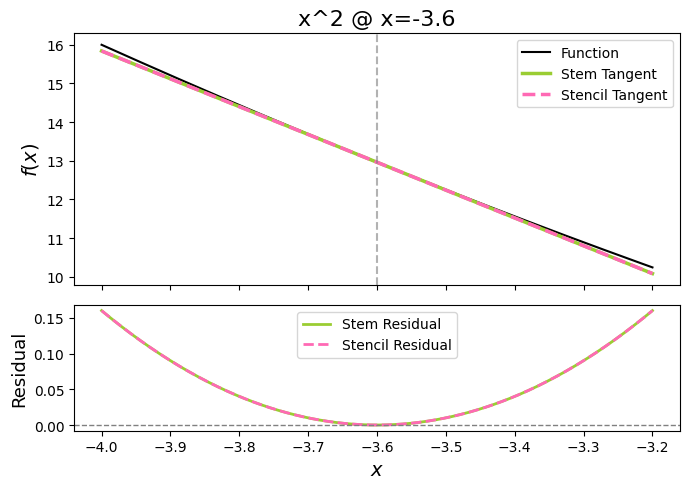

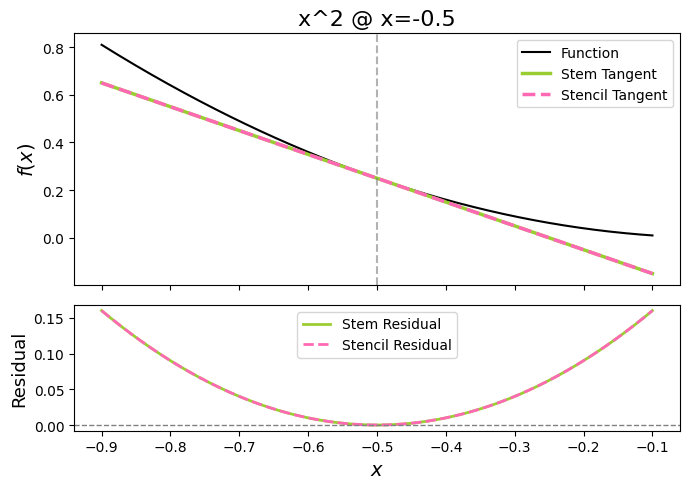

[stem_method] Component 0 did not converge, using fallback.


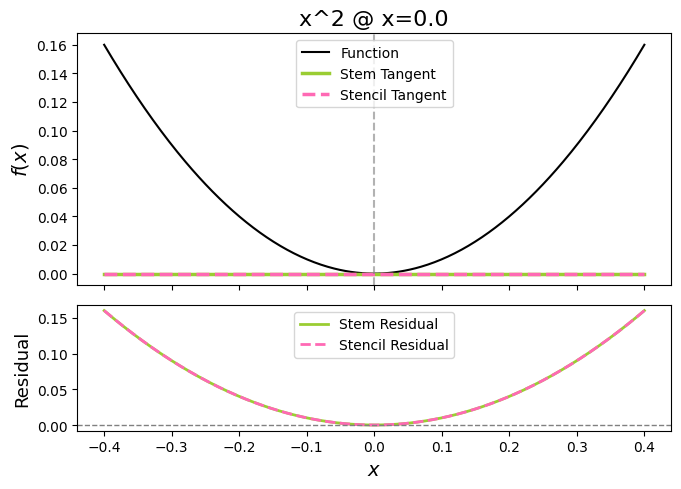

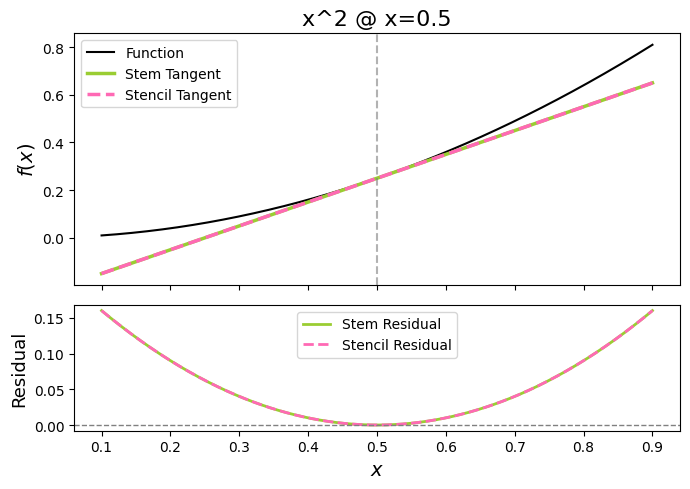

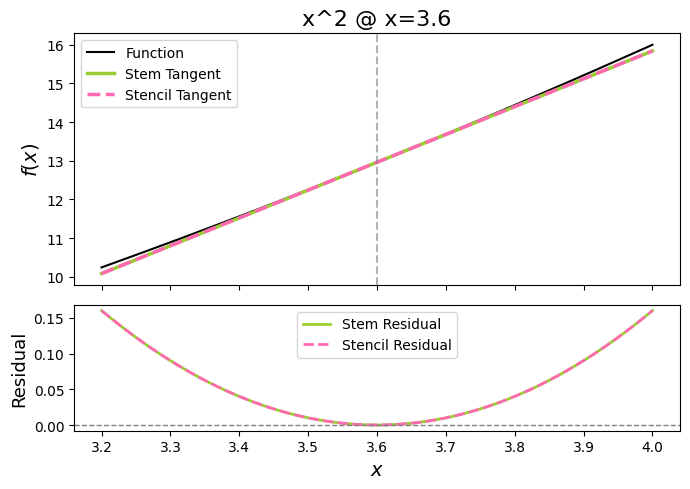

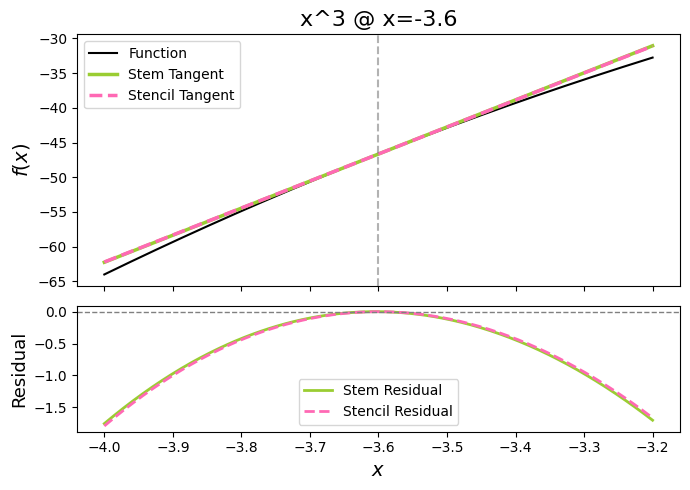

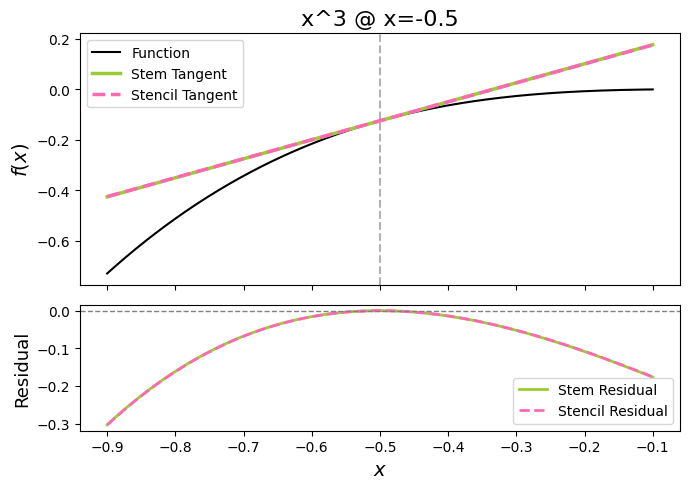

[stem_method] Component 0 did not converge, using fallback.


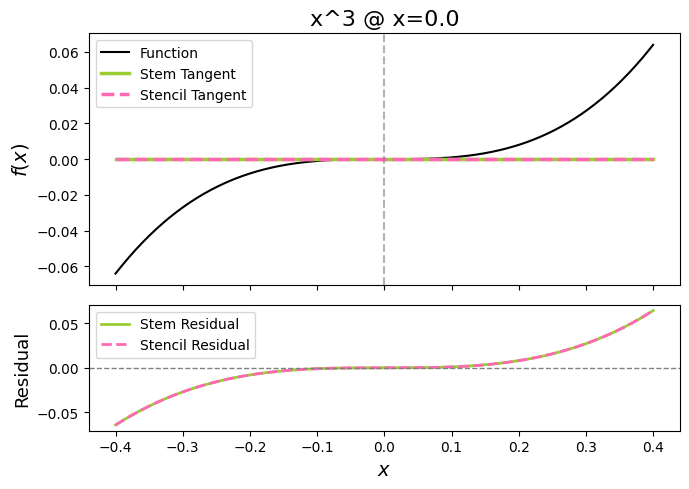

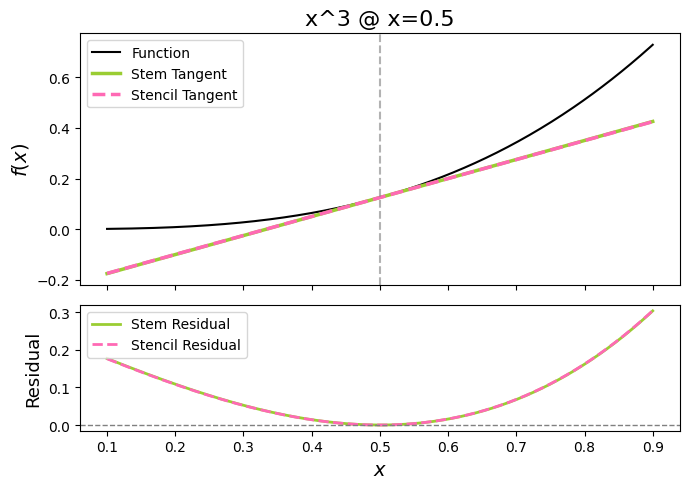

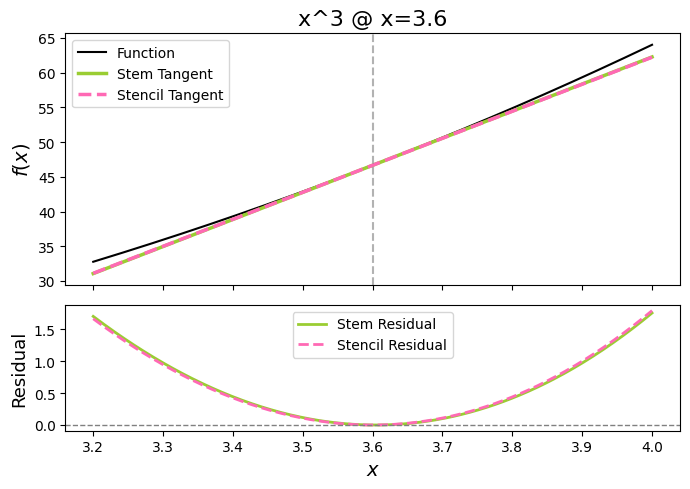

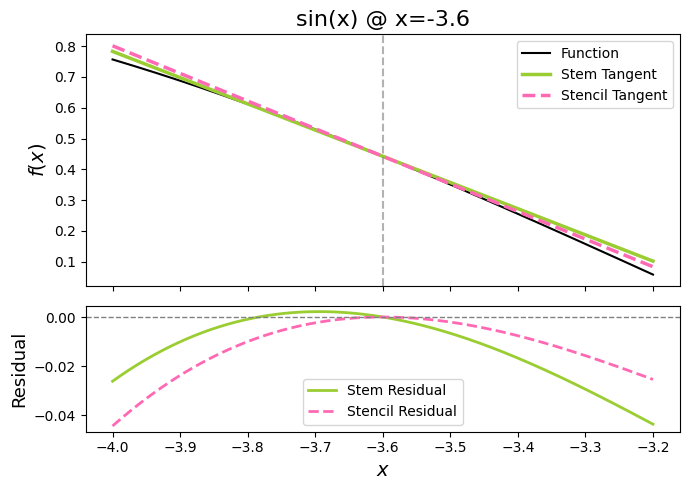

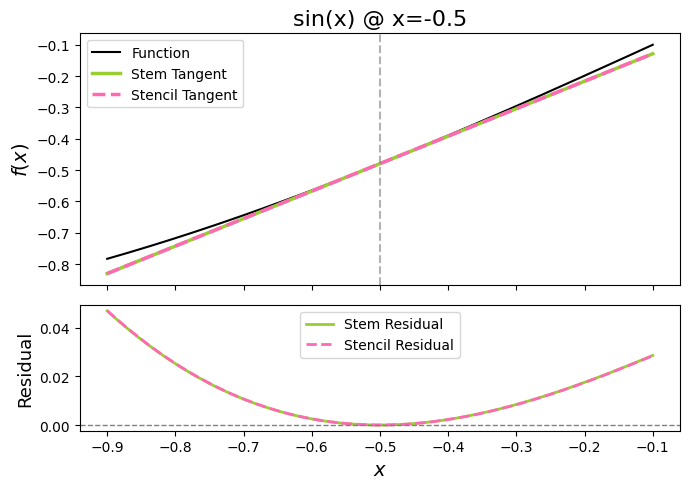

...

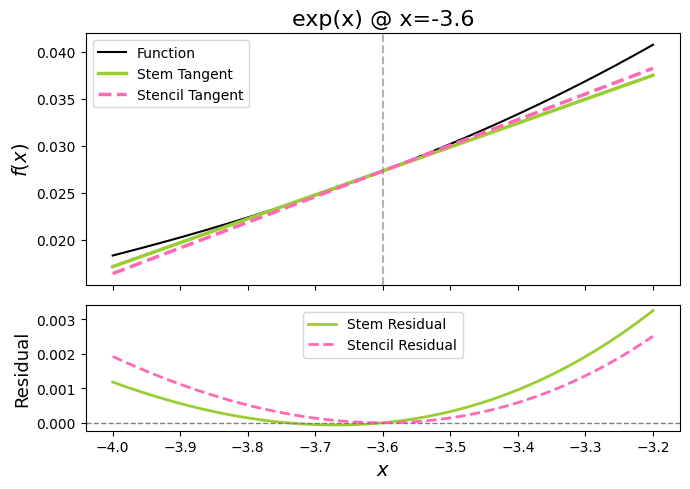

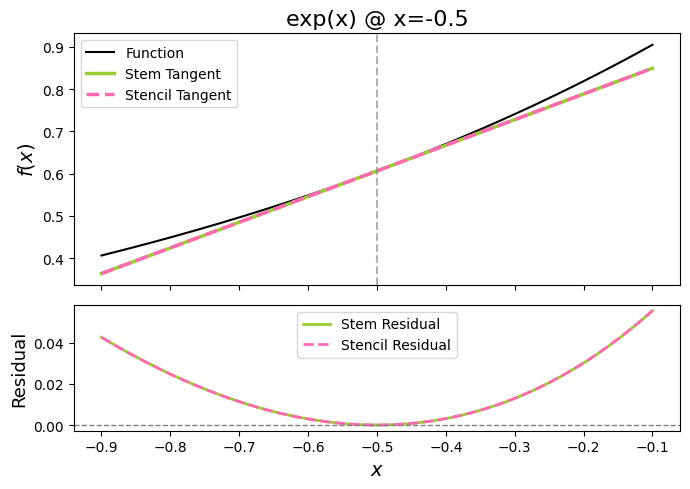

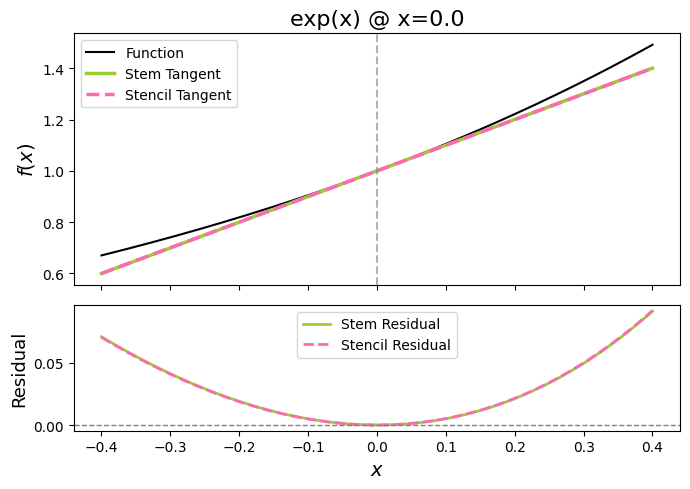

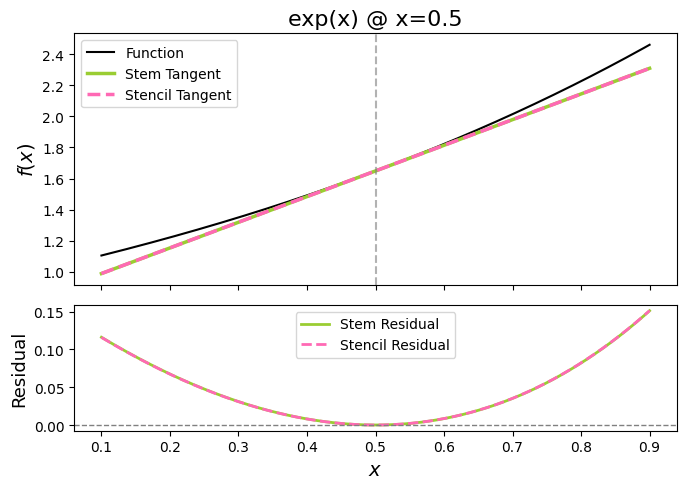

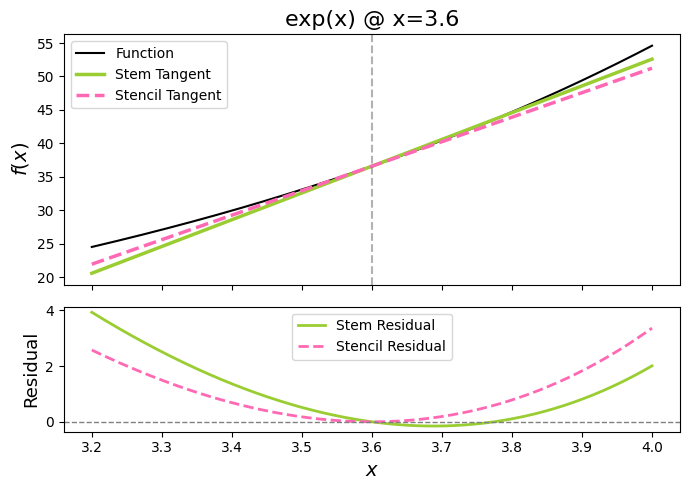

/var/folders/0x/z32gfbyx2ls71tblrjjbdh0w0000gn/T/ipykernel_1669/688836177.py:10: RuntimeWarning: invalid value encountered in log
  {"name": "ln(x + 2)", "func": lambda x: np.log(x + 2)},


[stem_method] Function not smooth or differentiable at central_value; excluding 0% offset.
[stem_method] Component 0 did not converge, using fallback.


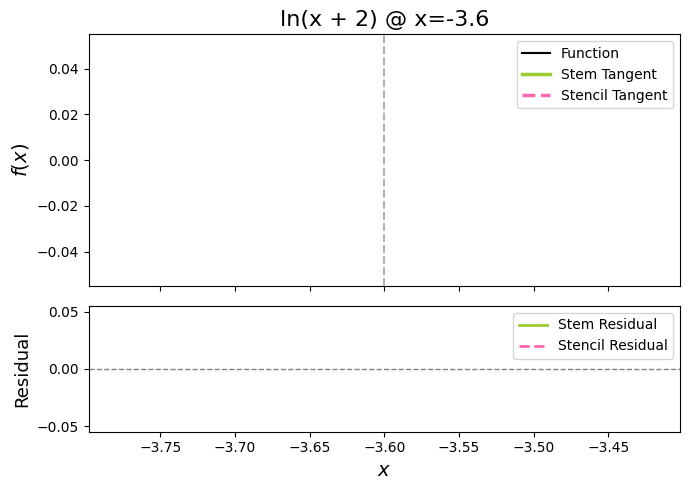

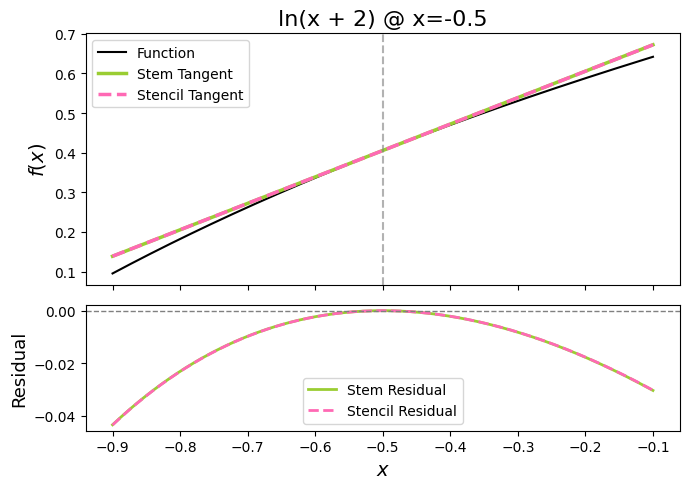

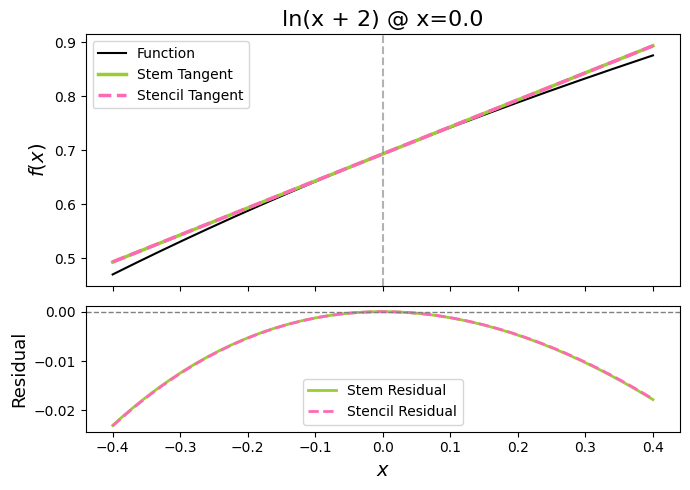

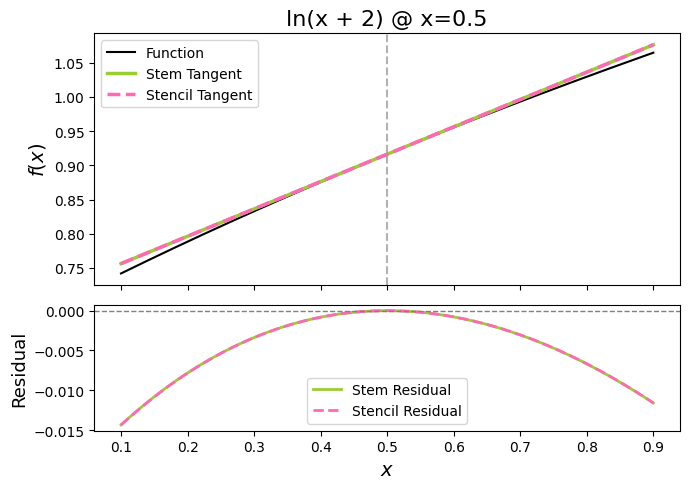

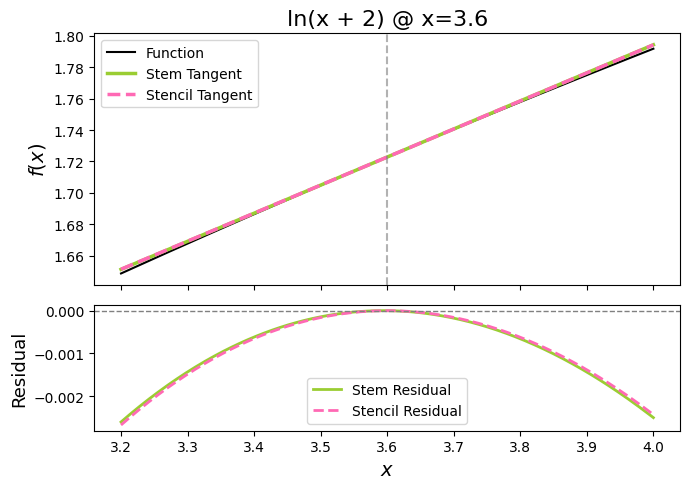

/var/folders/0x/z32gfbyx2ls71tblrjjbdh0w0000gn/T/ipykernel_1669/688836177.py:11: RuntimeWarning: invalid value encountered in sqrt
  {"name": "sqrt(x + 1)", "func": lambda x: np.sqrt(x + 1)},


[stem_method] Function not smooth or differentiable at central_value; excluding 0% offset.
[stem_method] Component 0 did not converge, using fallback.


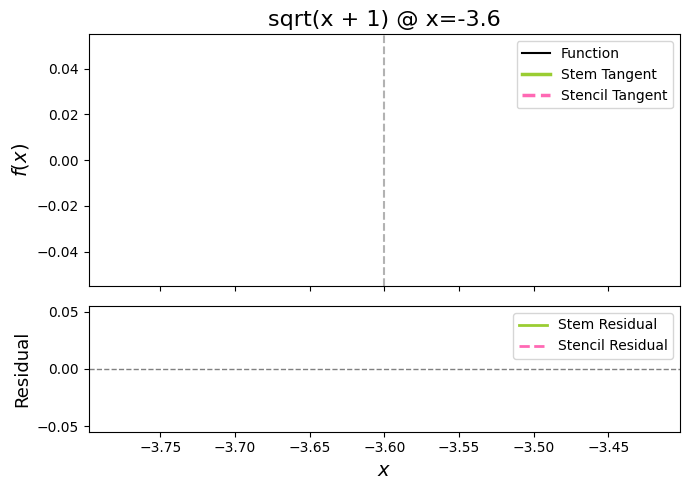

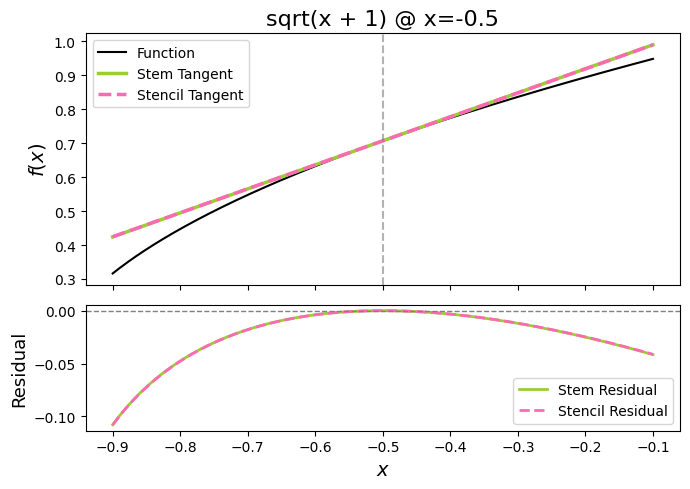

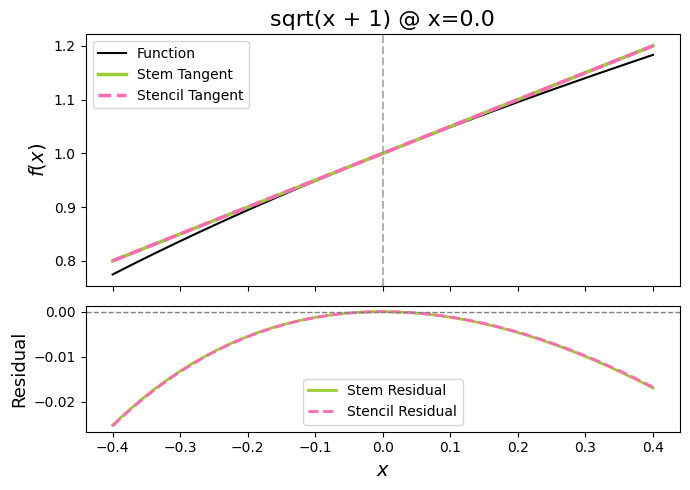

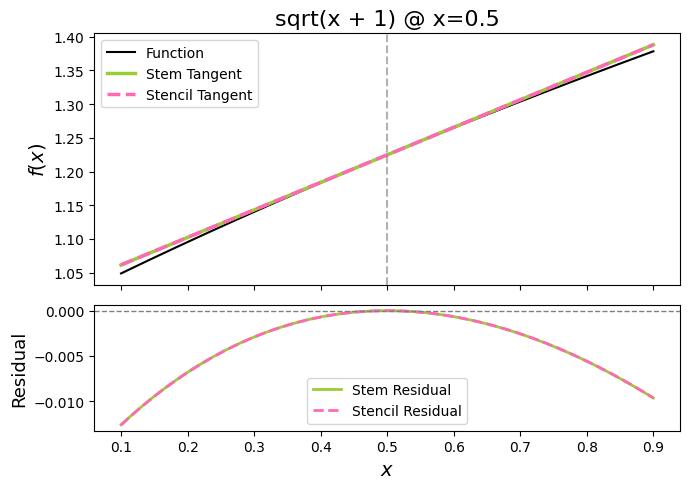

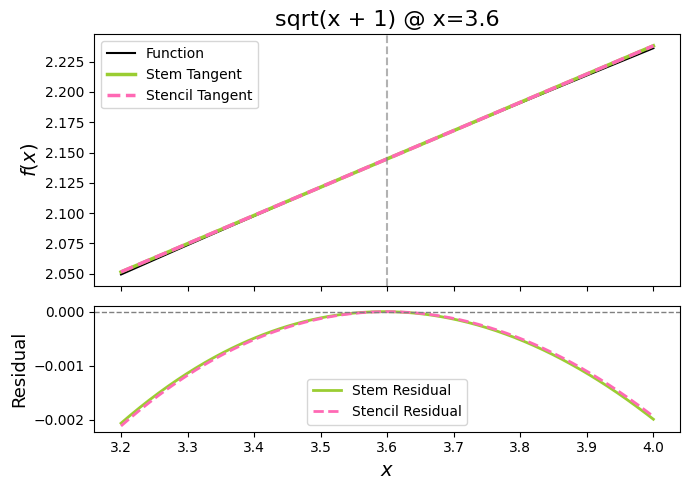

...

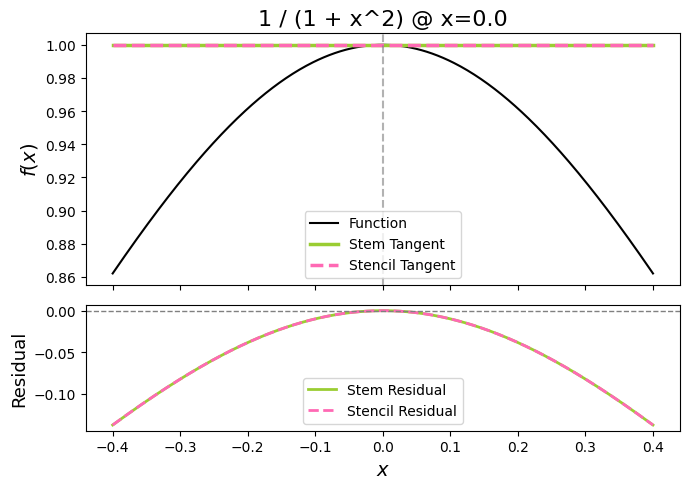

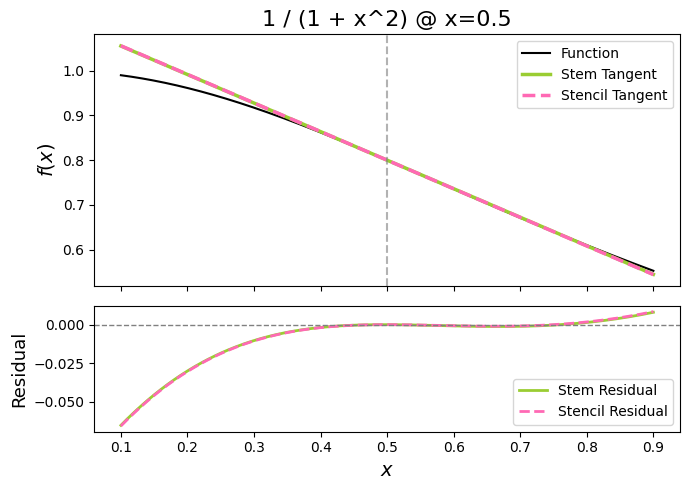

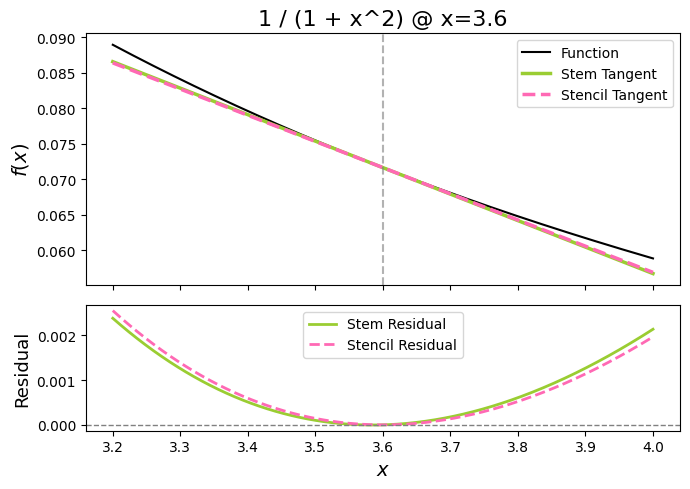

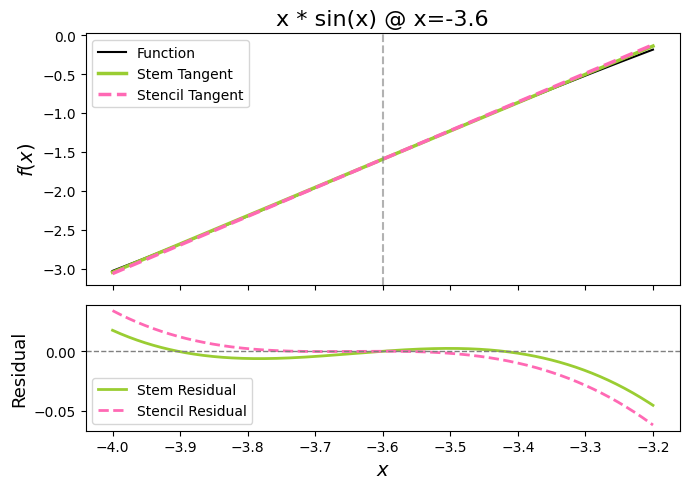

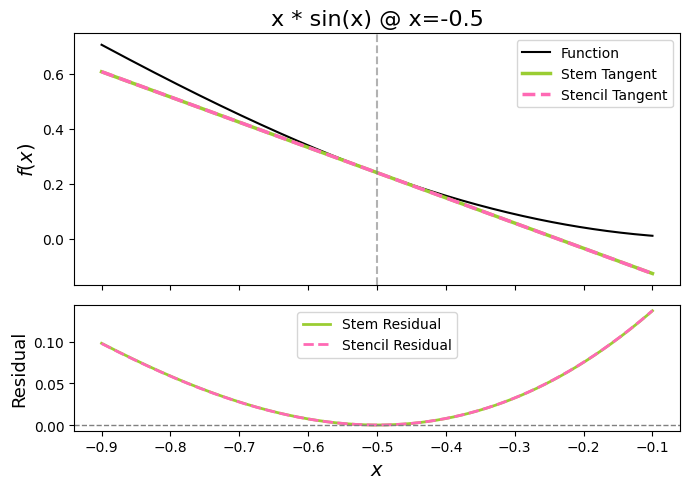

[stem_method] Component 0 did not converge, using fallback.


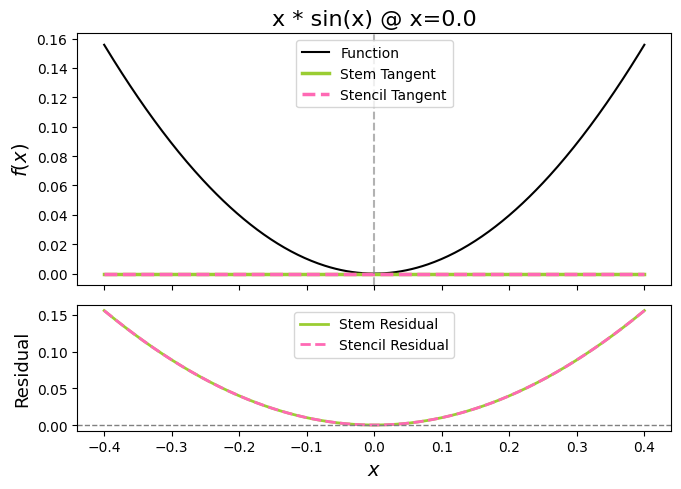

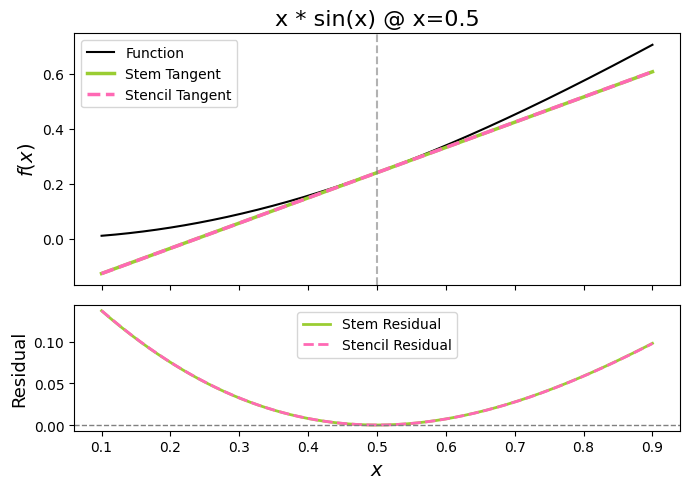

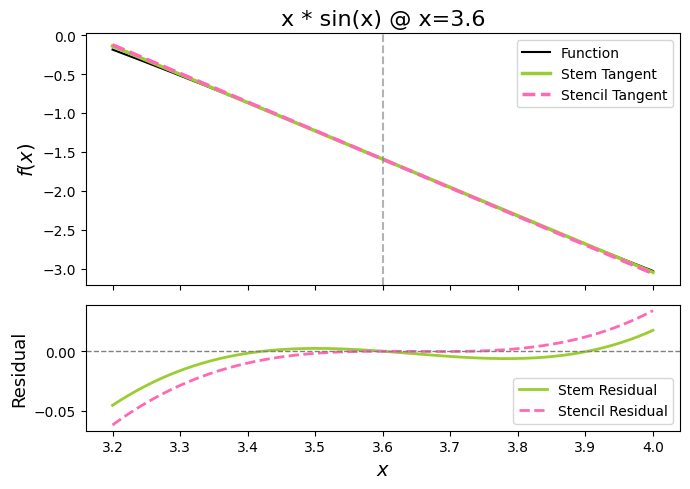

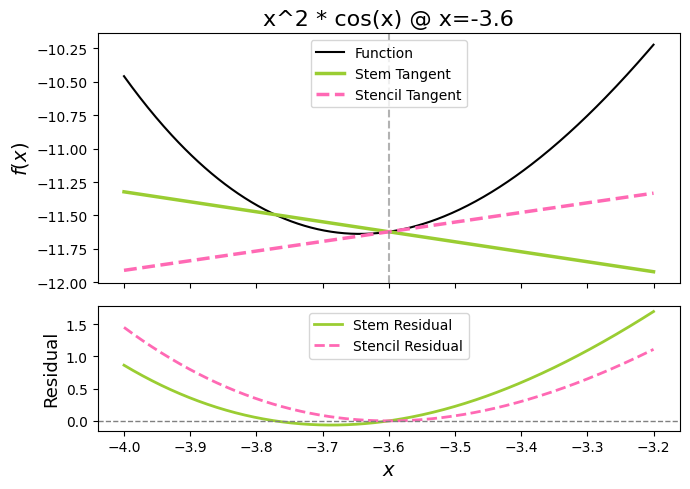

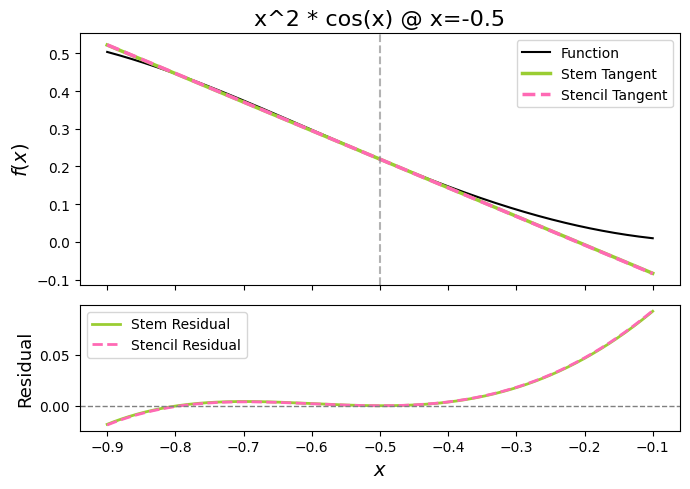

[stem_method] Component 0 did not converge, using fallback.


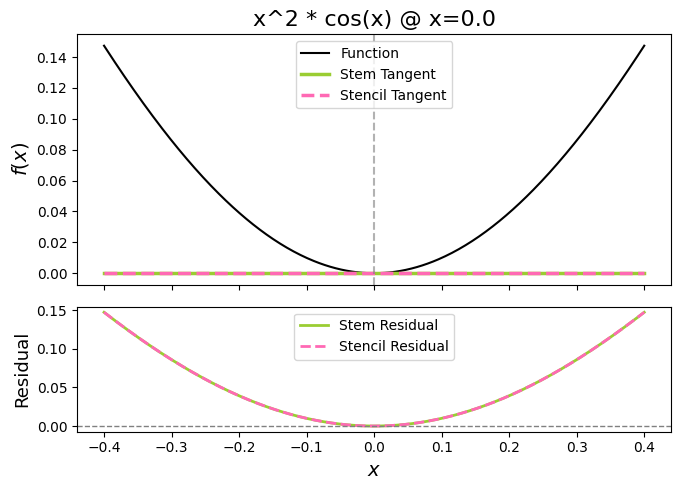

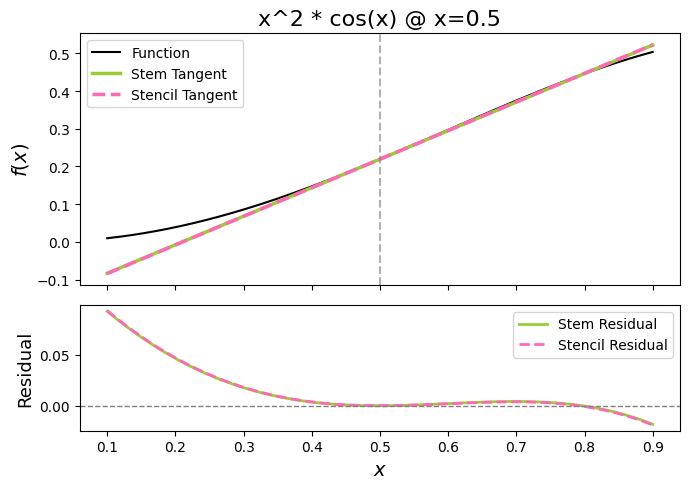

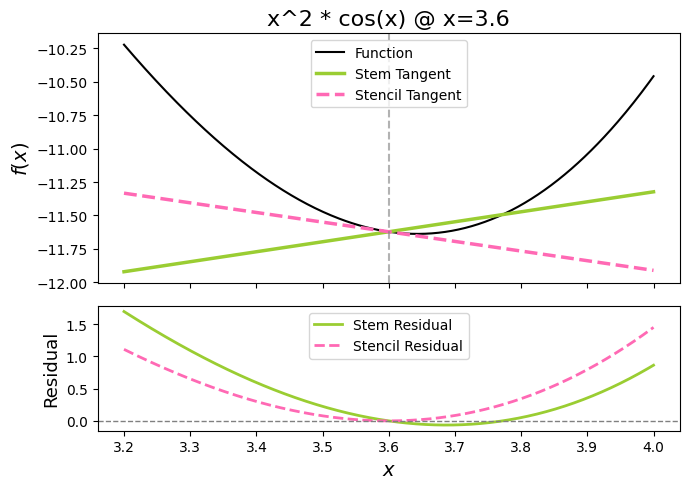

[stem_method] Component 0 did not converge, using fallback.


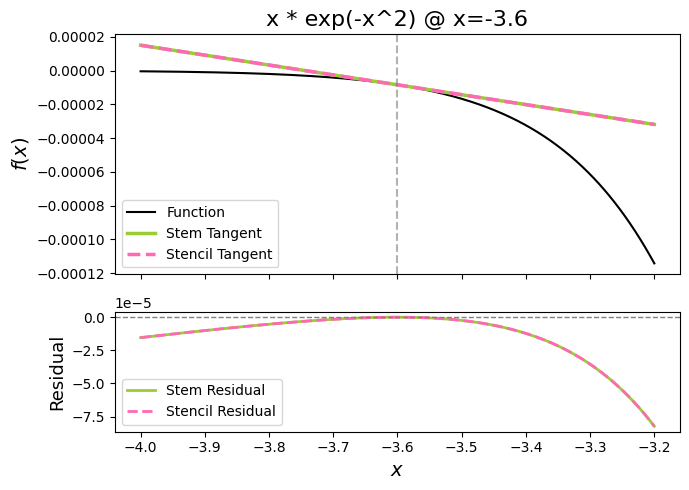

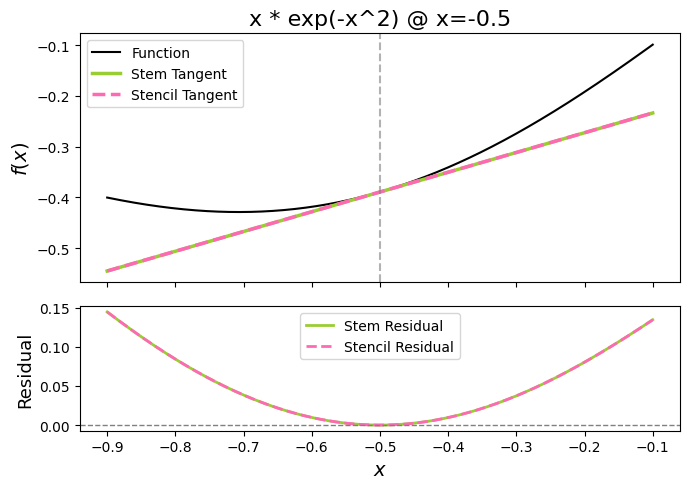

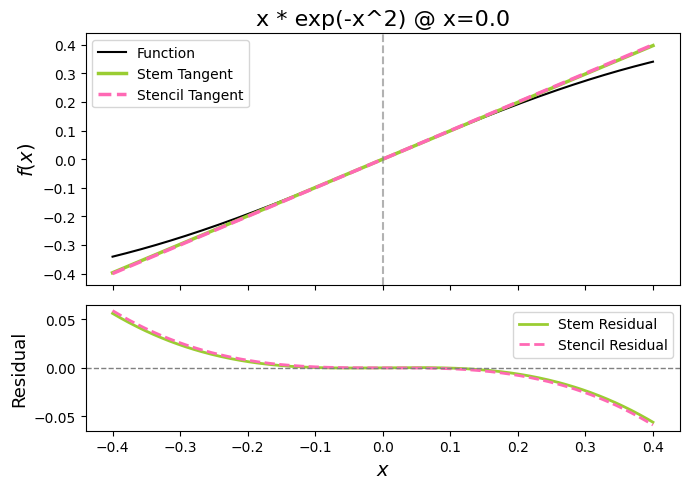

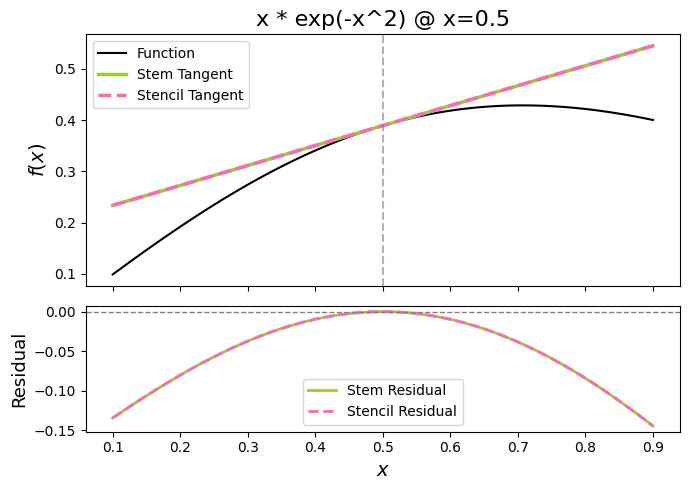

[stem_method] Component 0 did not converge, using fallback.


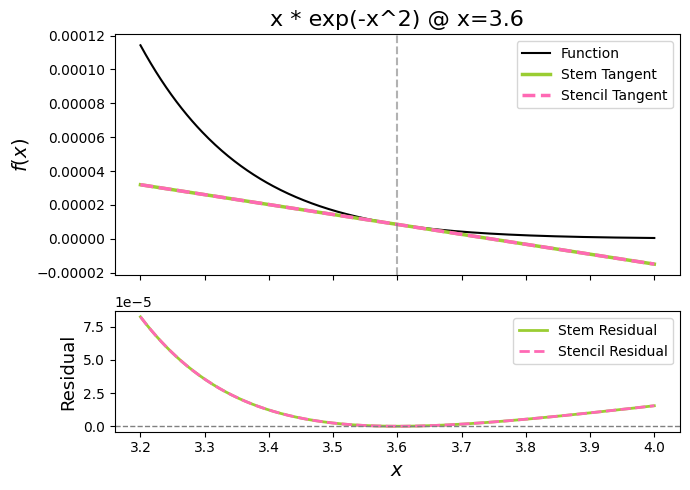

[stem_method] Component 0 did not converge, using fallback.


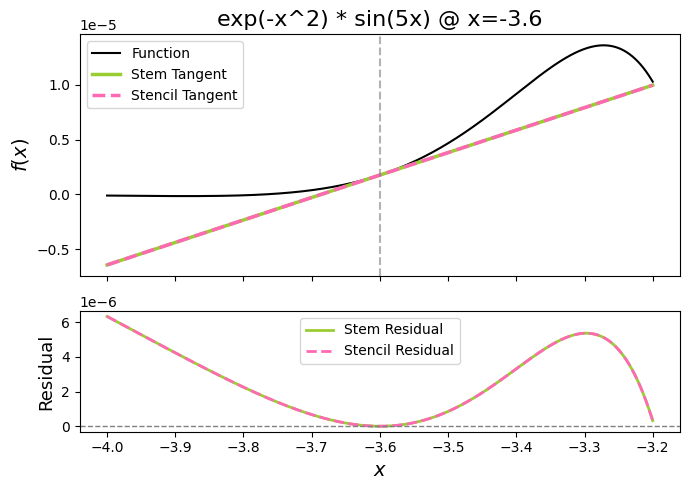

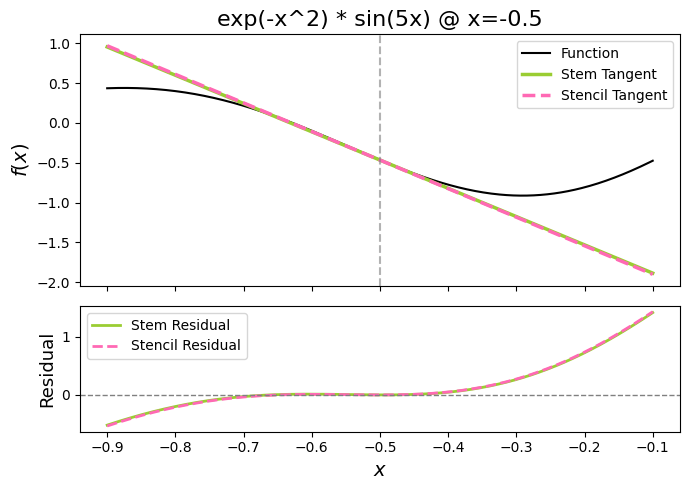

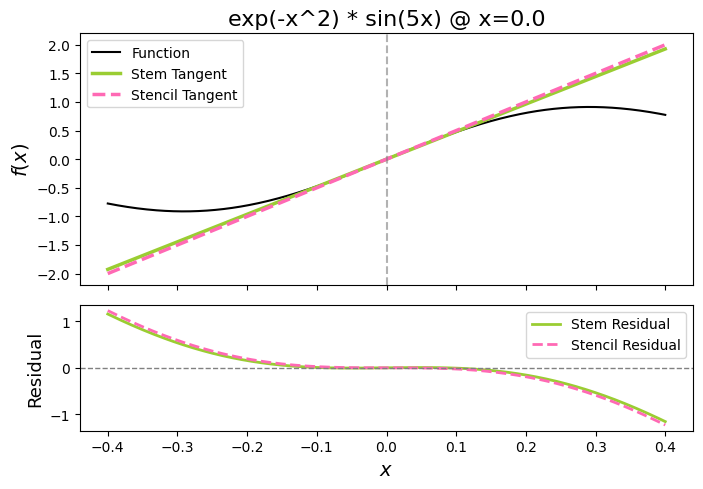

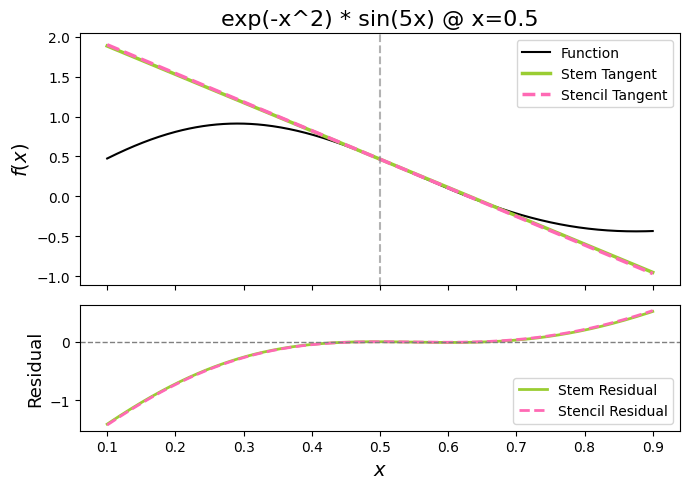

[stem_method] Component 0 did not converge, using fallback.


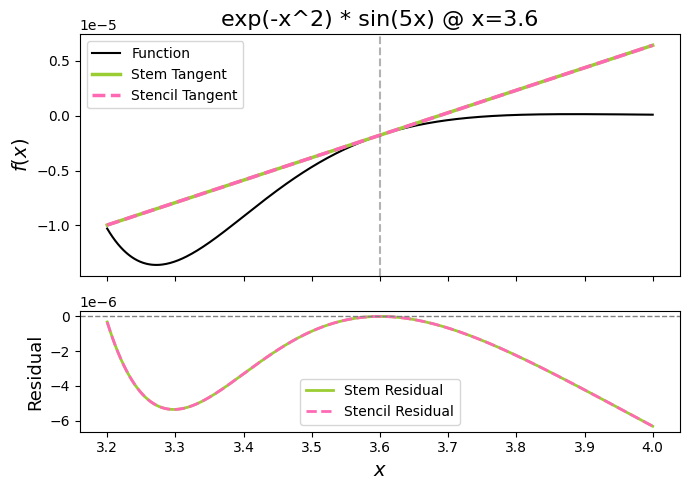

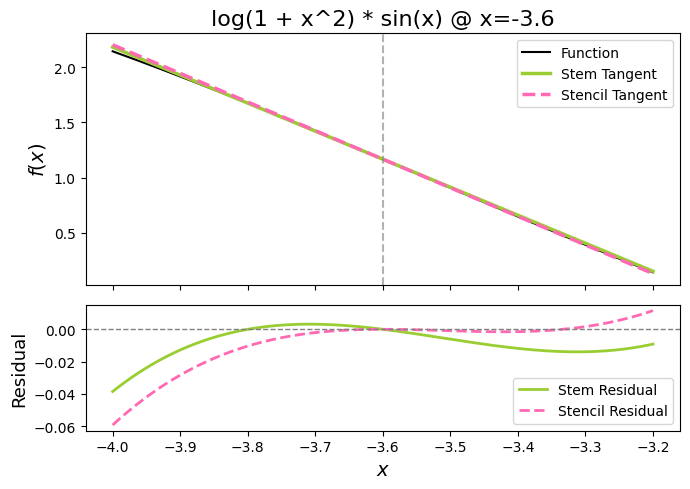

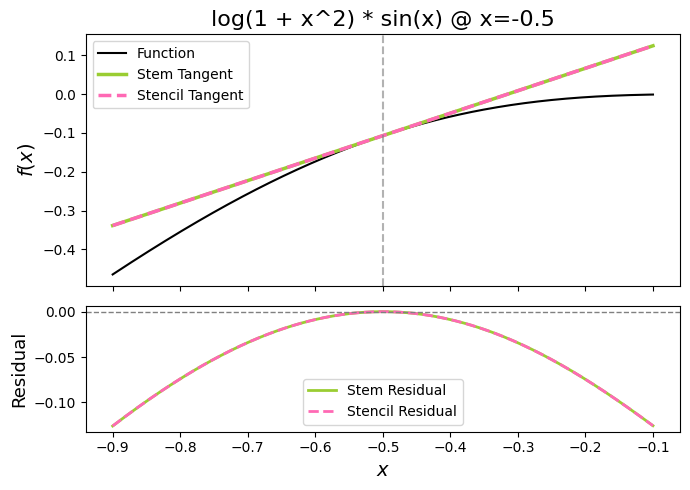

[stem_method] Component 0 did not converge, using fallback.


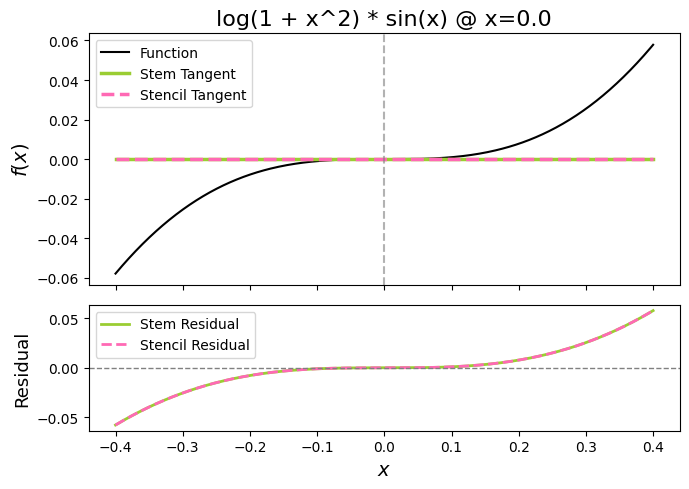

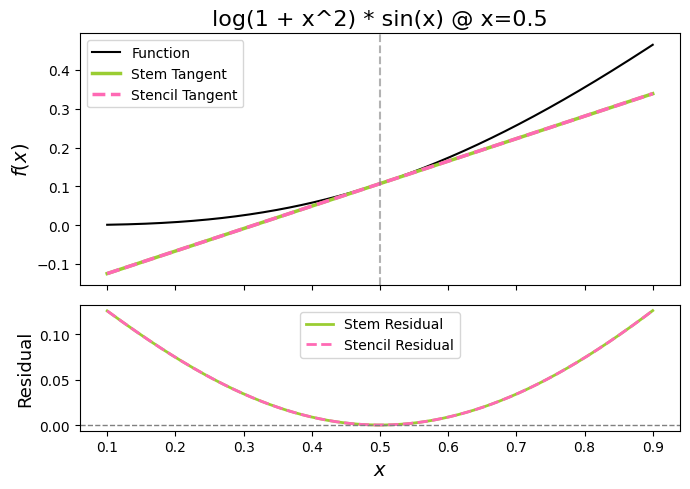

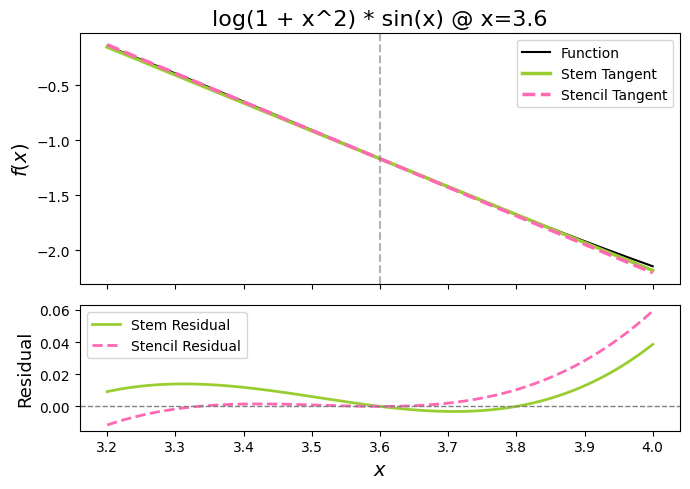

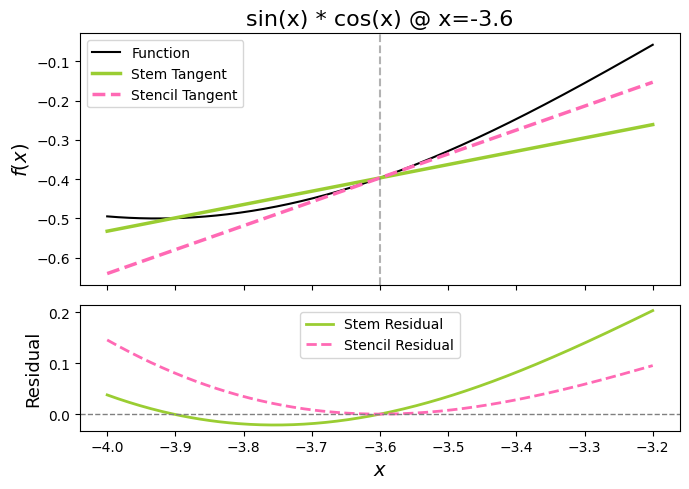

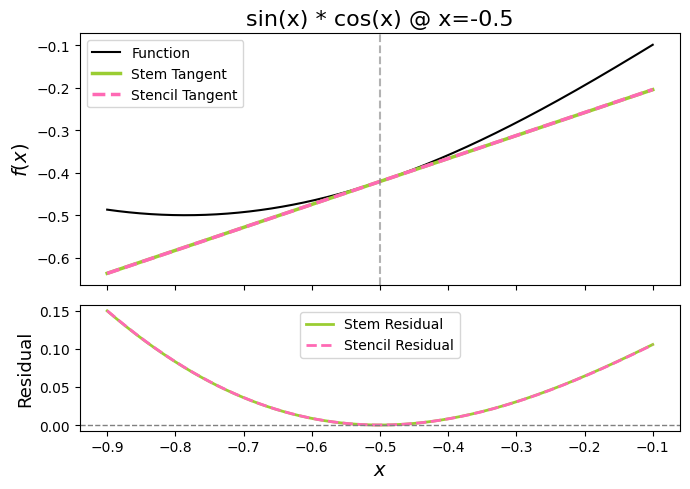

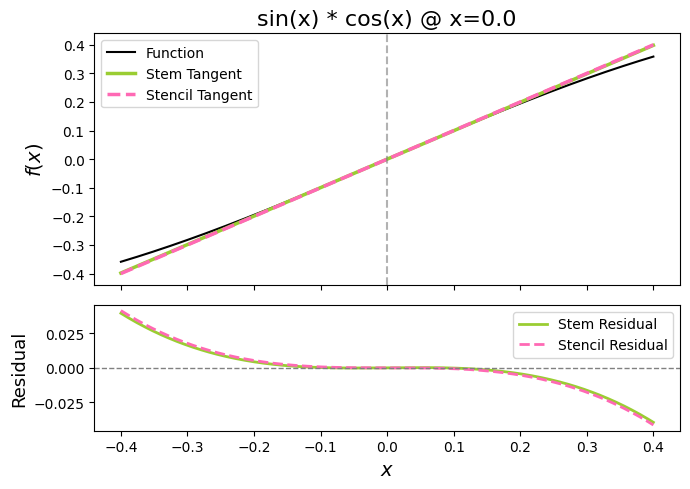

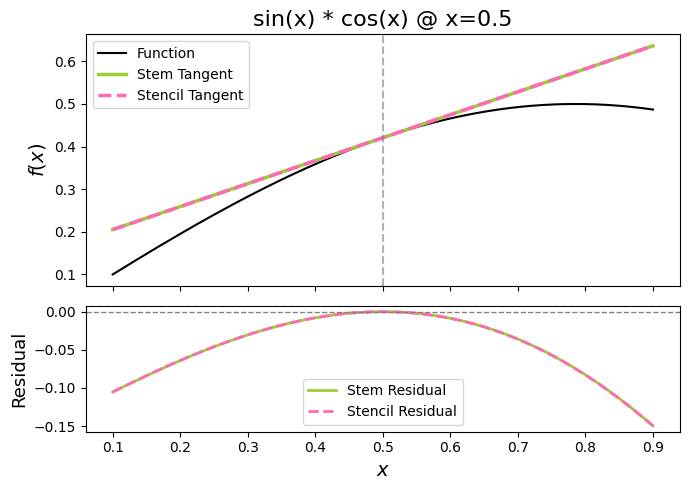

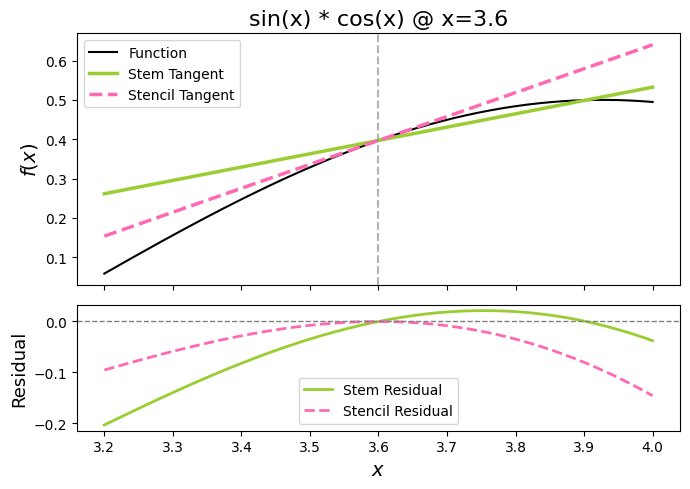

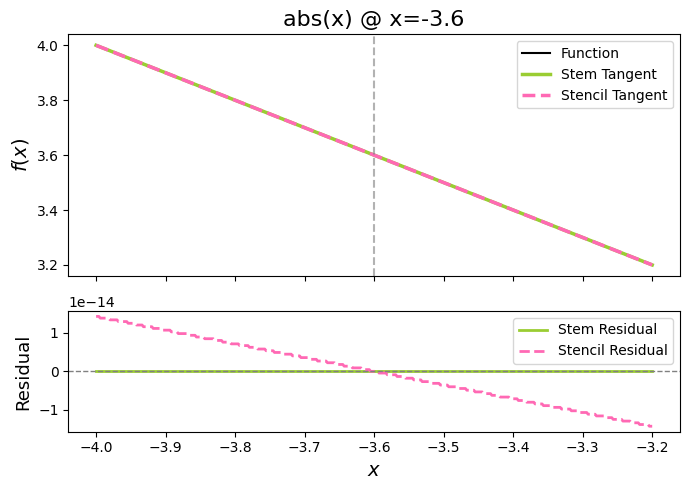

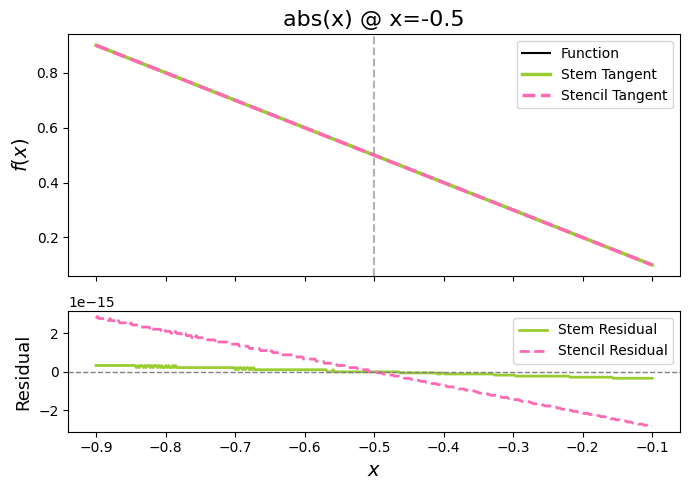

[stem_method] Function not smooth or differentiable at central_value; excluding 0% offset.
[stem_method] Component 0 did not converge, using fallback.


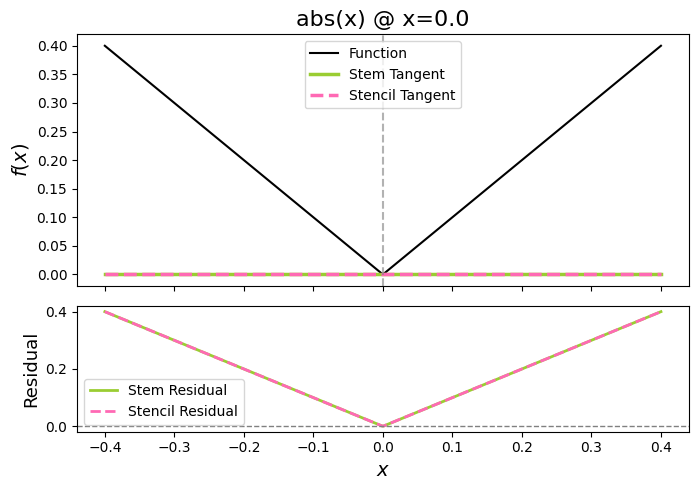

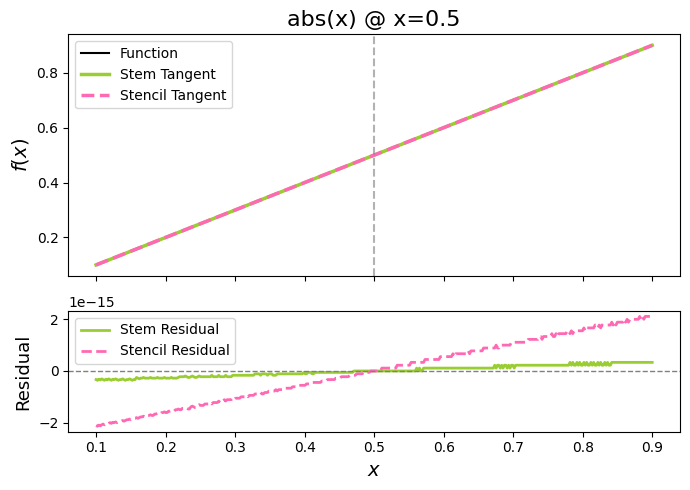

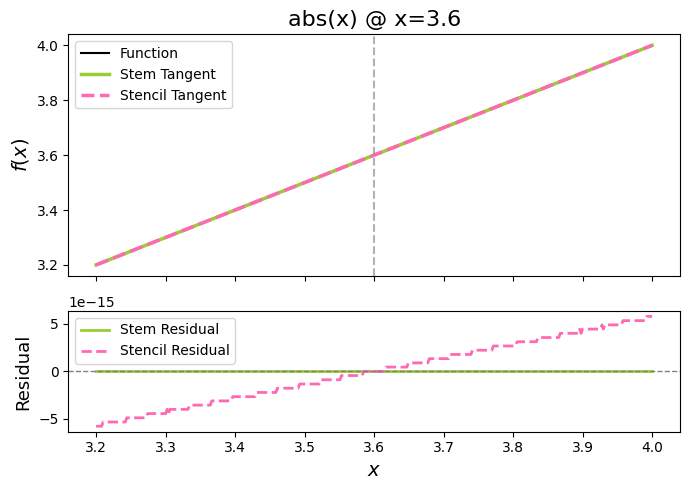

❌ Error for Piecewise (x^2 / sqrt(x+1)) at x=-3.6: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
❌ Error for Piecewise (x^2 / sqrt(x+1)) at x=-0.5: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
[stem_method] Function not smooth or differentiable at central_value; excluding 0% offset.
❌ Error for Piecewise (x^2 / sqrt(x+1)) at x=0.0: [Errno 2] No such file or directory: 'logs/stem_debug_20250609_Piecewise (x^2 / sqrt(x+1)).log'
❌ Error for Piecewise (x^2 / sqrt(x+1)) at x=0.5: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
❌ Error for Piecewise (x^2 / sqrt(x+1)) at x=3.6: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
❌ Error for Piecewise sin or cos at x=-3.6: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
❌ Error for Piecewise sin or cos at x=-0.5: The truth val

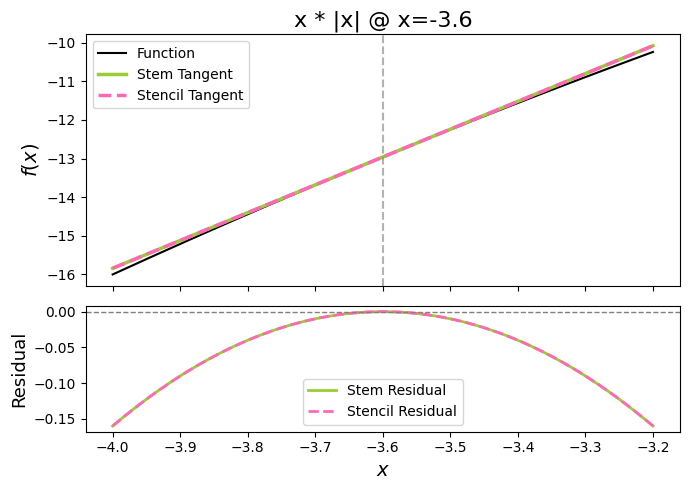

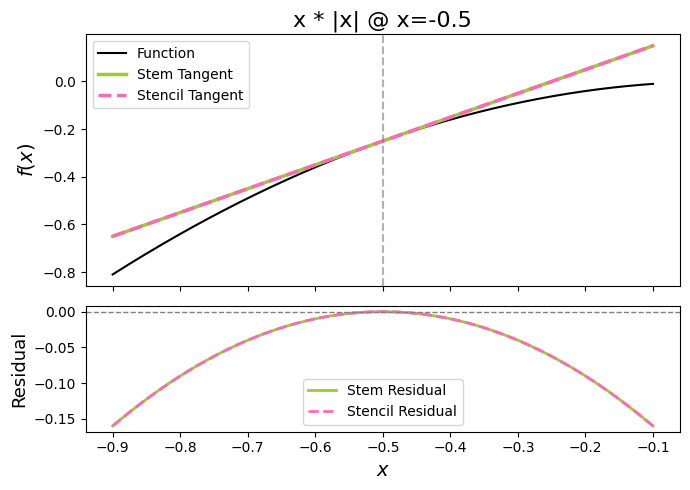

[stem_method] Component 0 did not converge, using fallback.


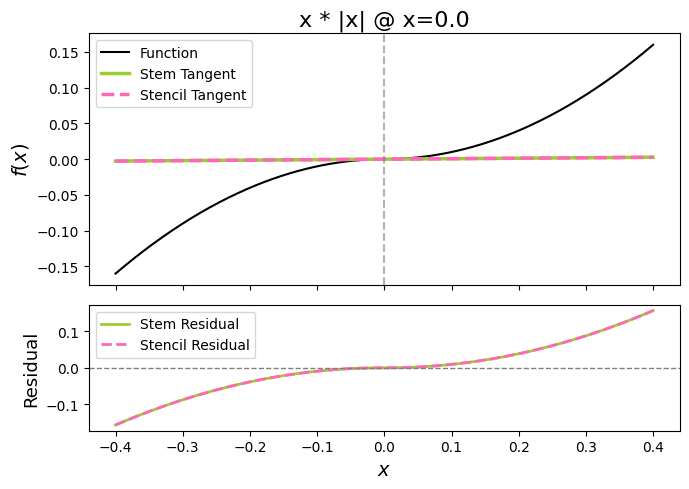

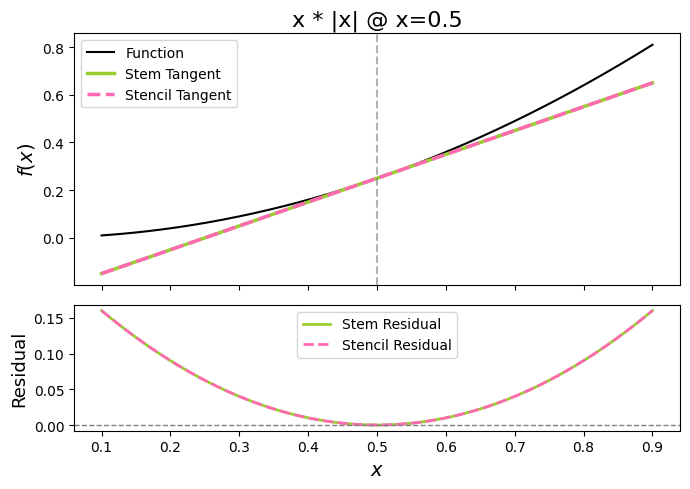

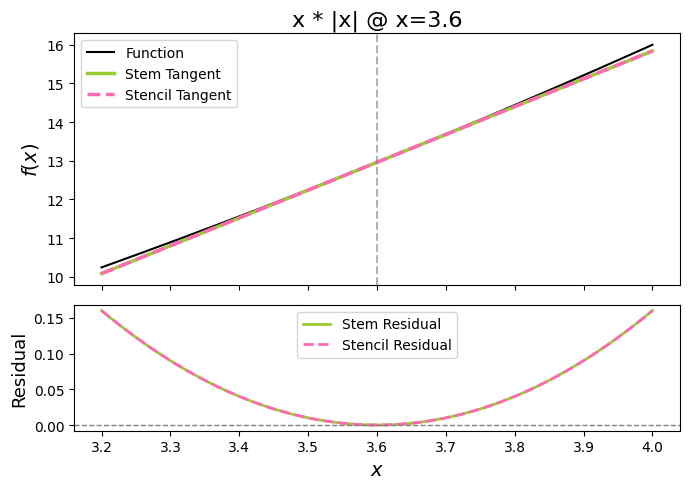

❌ Error for Heaviside(x) at x=-3.6: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
❌ Error for Heaviside(x) at x=-0.5: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
[stem_method] Function not smooth or differentiable at central_value; excluding 0% offset.
[stem_method] Component 0 did not converge, using fallback.
❌ Error for Heaviside(x) at x=0.0: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
❌ Error for Heaviside(x) at x=0.5: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
❌ Error for Heaviside(x) at x=3.6: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
[stem_method] Component 0 did not converge, using fallback.


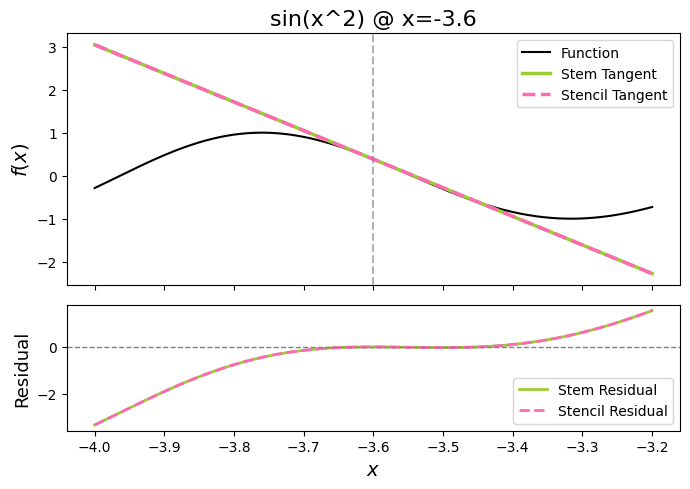

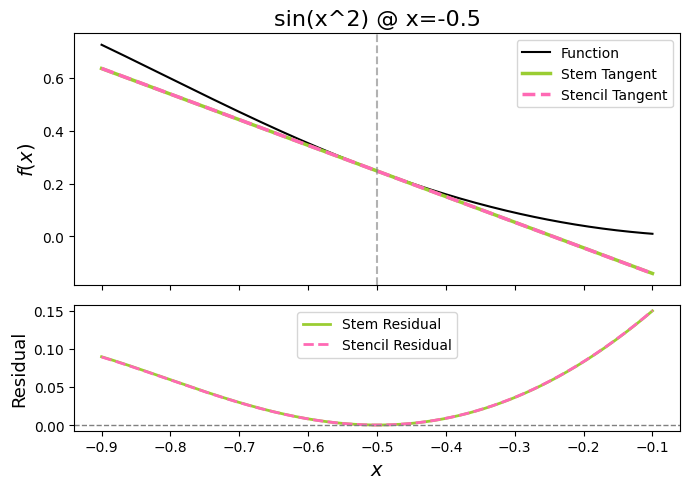

[stem_method] Component 0 did not converge, using fallback.


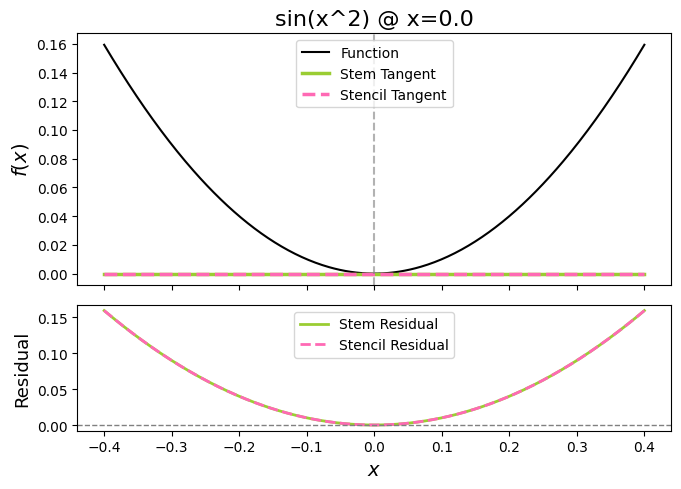

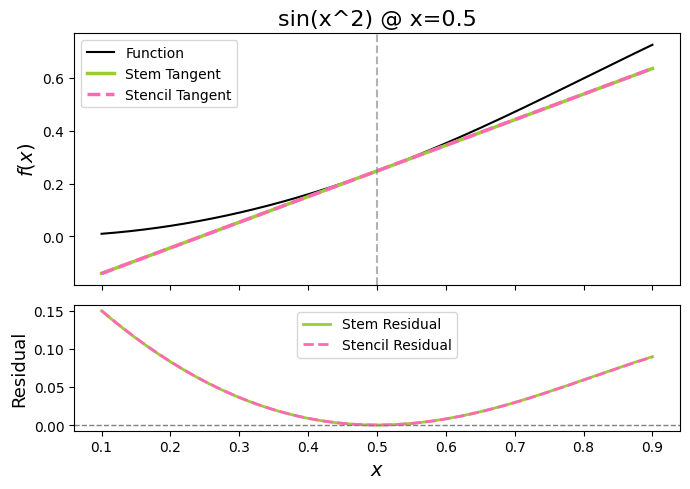

[stem_method] Component 0 did not converge, using fallback.


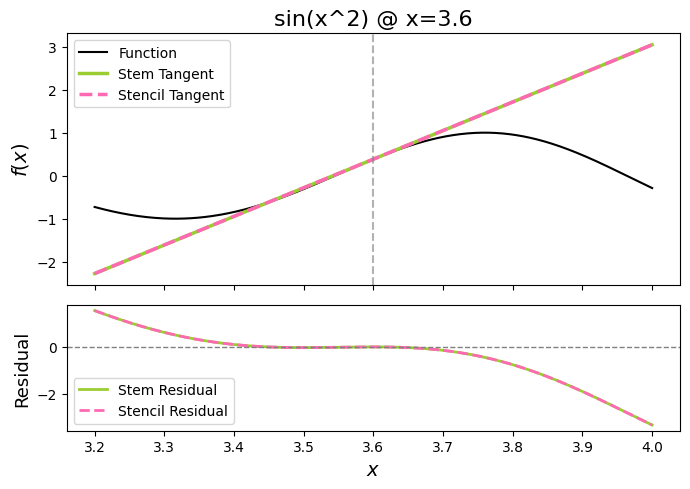

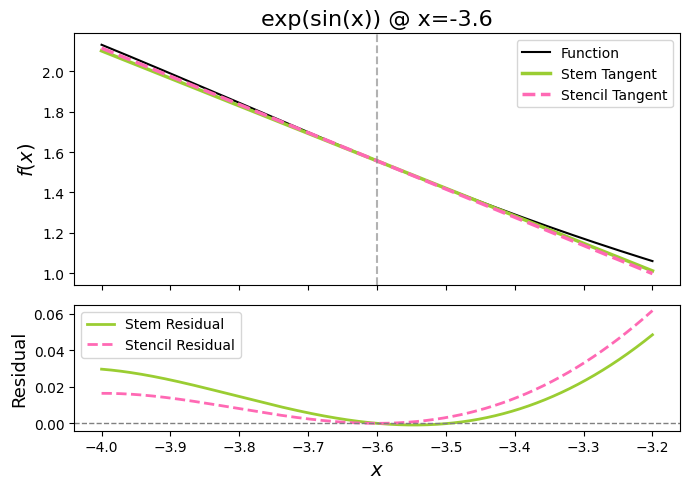

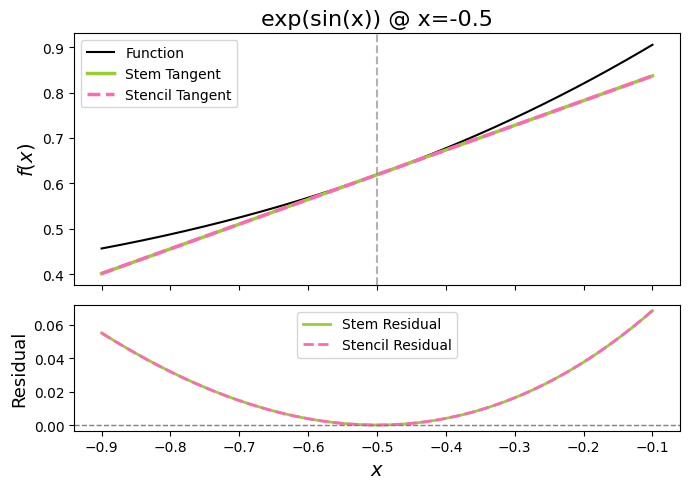

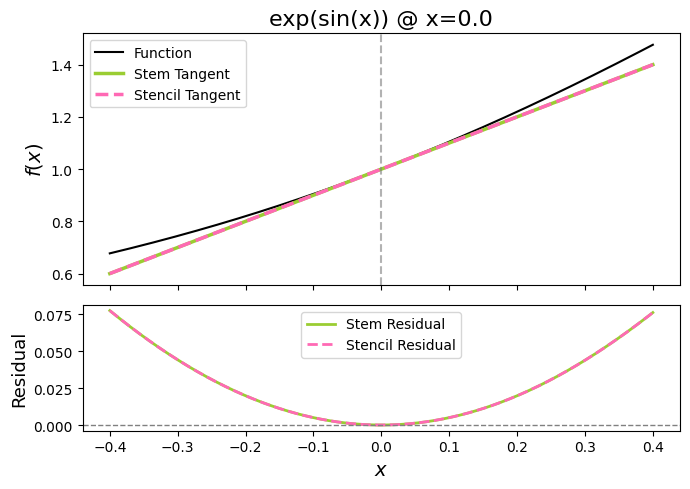

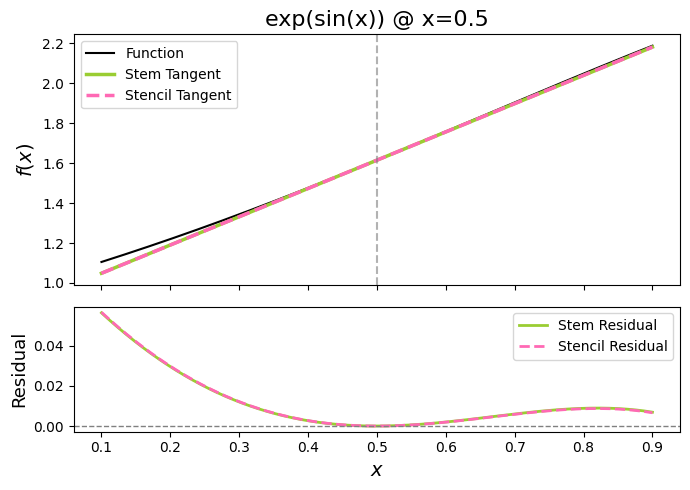

...

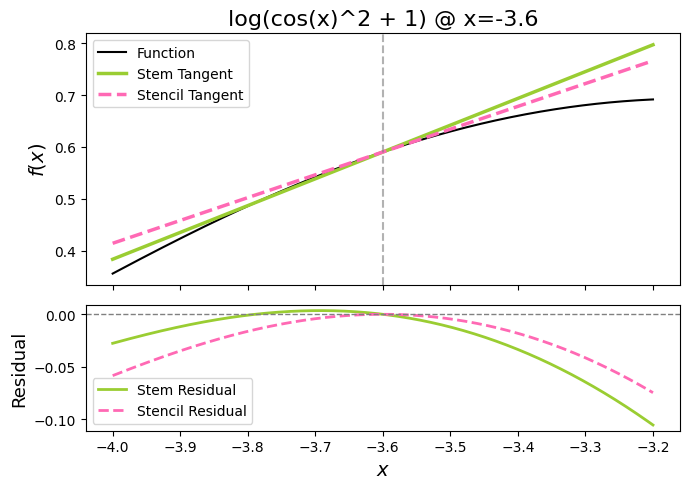

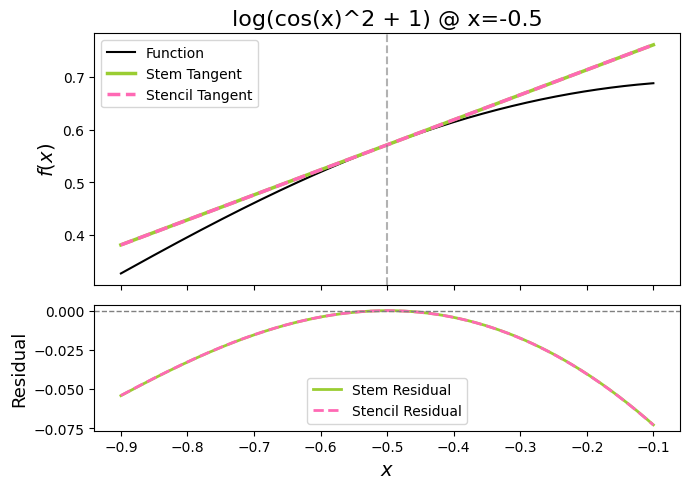

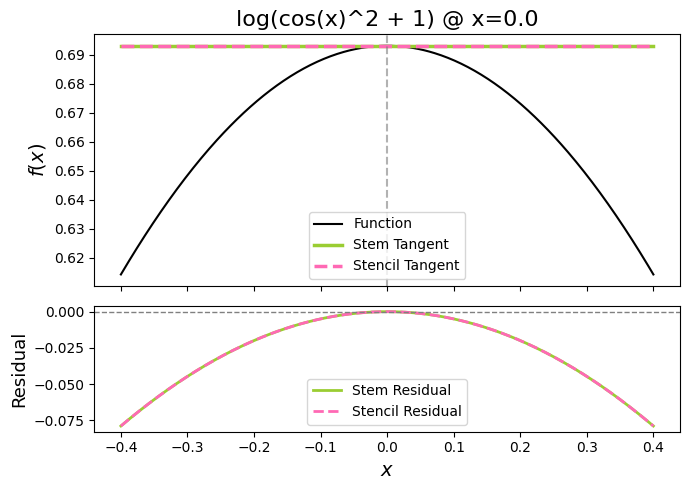

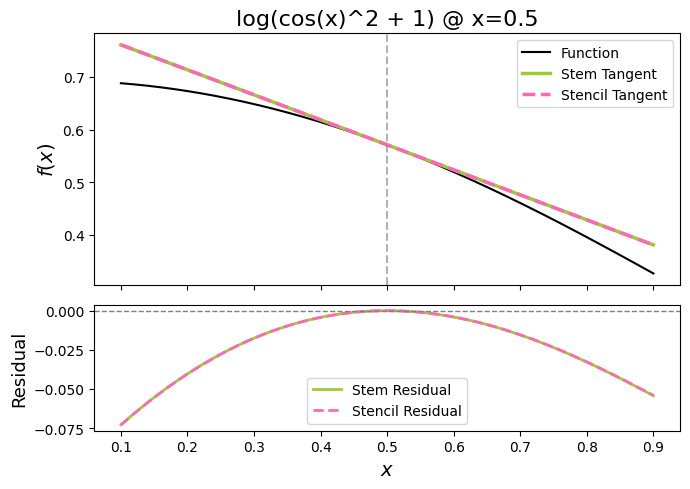

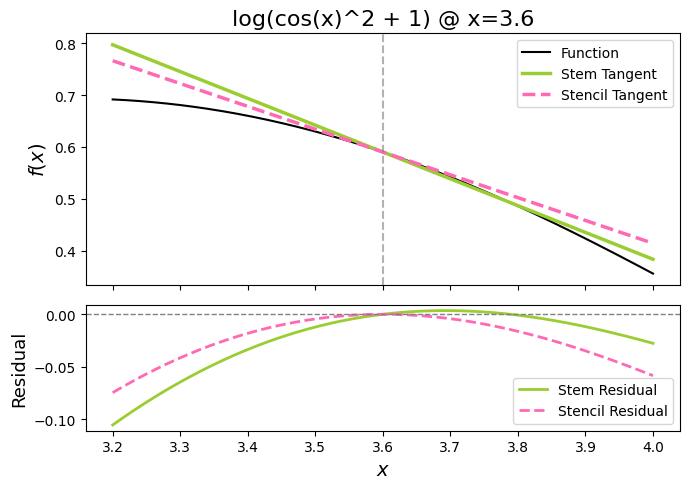

[stem_method] Function not smooth or differentiable at central_value; excluding 0% offset.
[stem_method] Component 0 did not converge, using fallback.


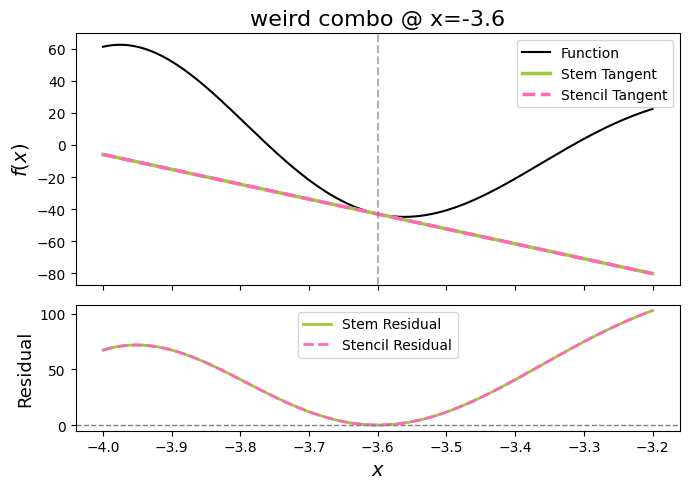

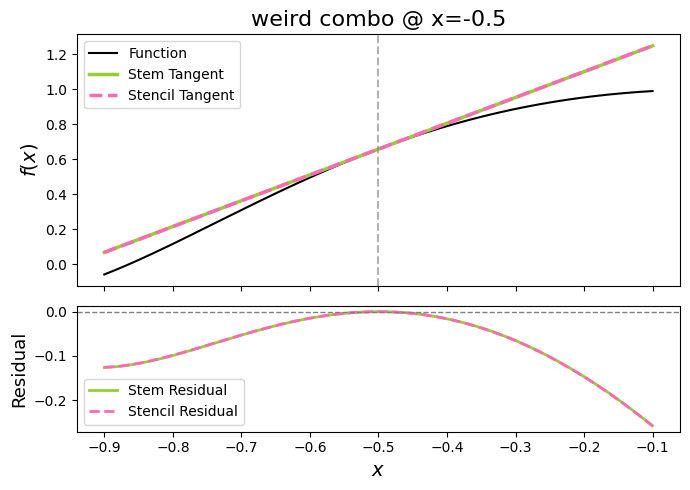

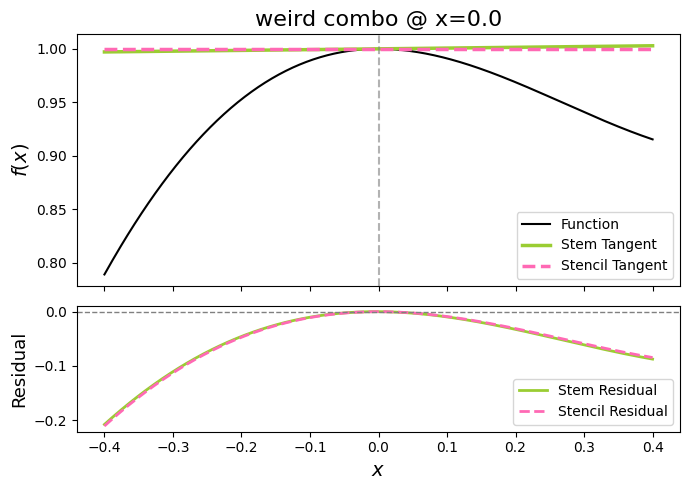

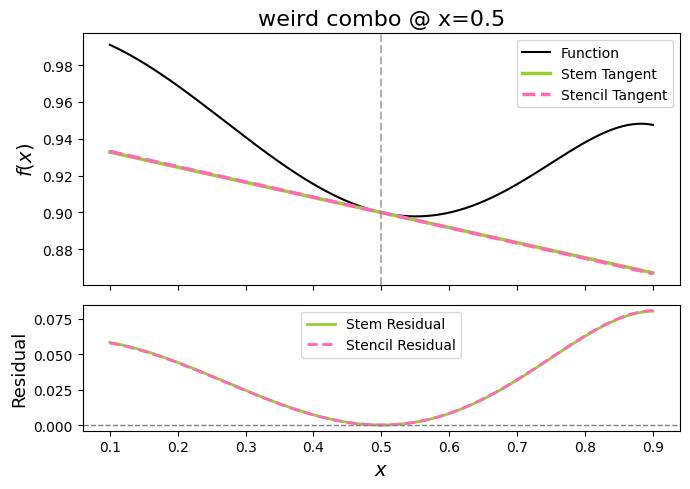

[stem_method] Function not smooth or differentiable at central_value; excluding 0% offset.
[stem_method] Component 0 did not converge, using fallback.


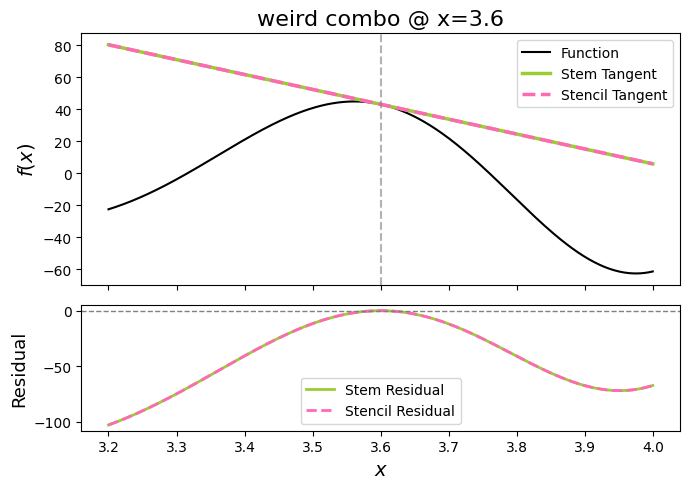

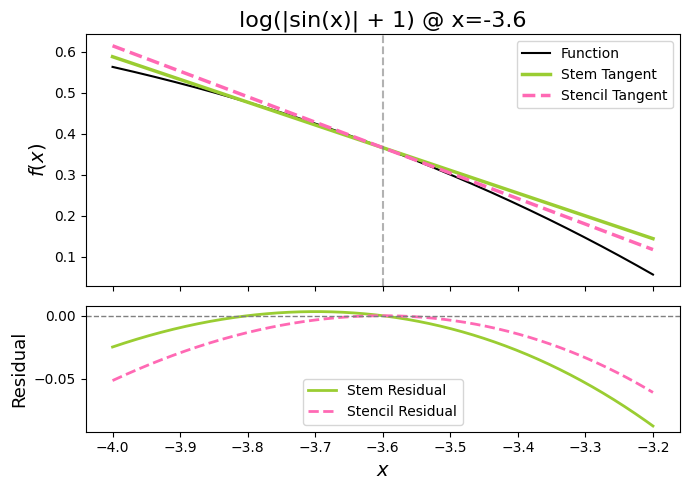

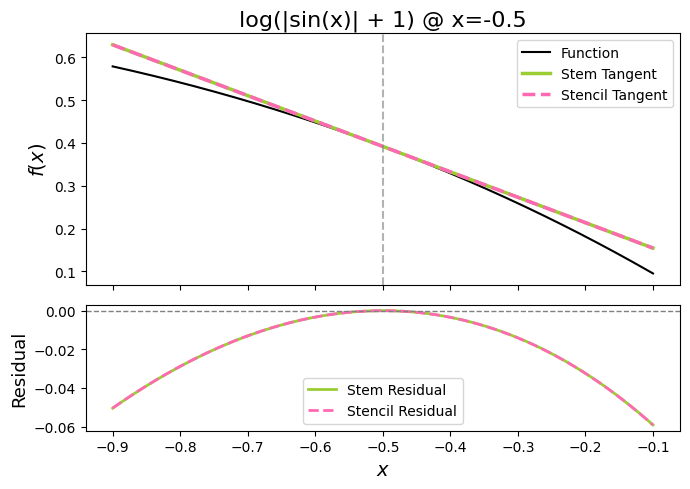

[stem_method] Function not smooth or differentiable at central_value; excluding 0% offset.
[stem_method] Component 0 did not converge, using fallback.


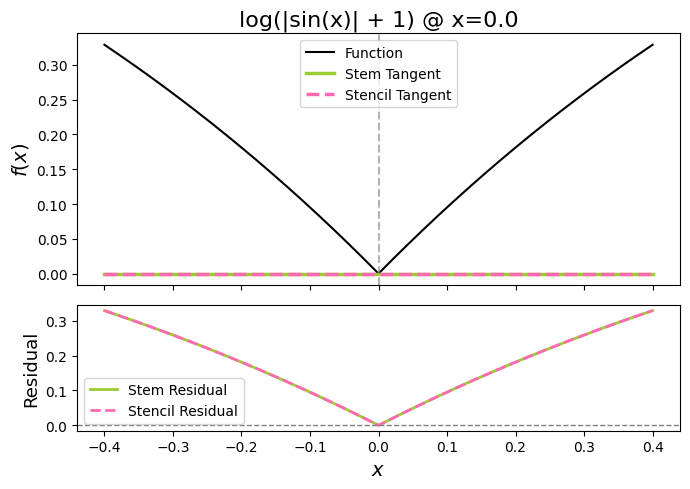

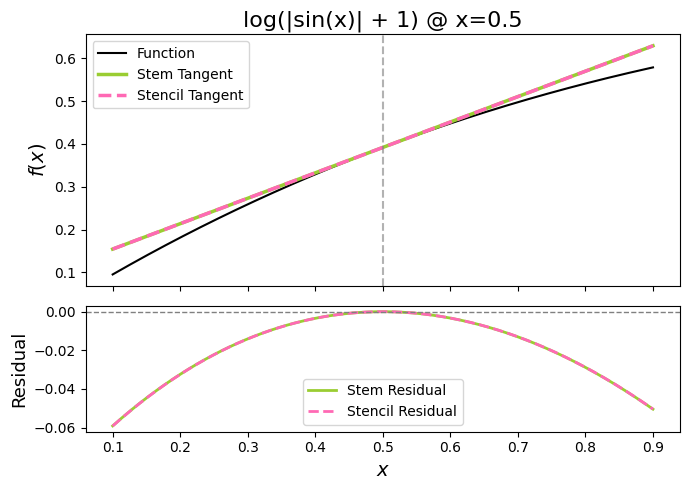

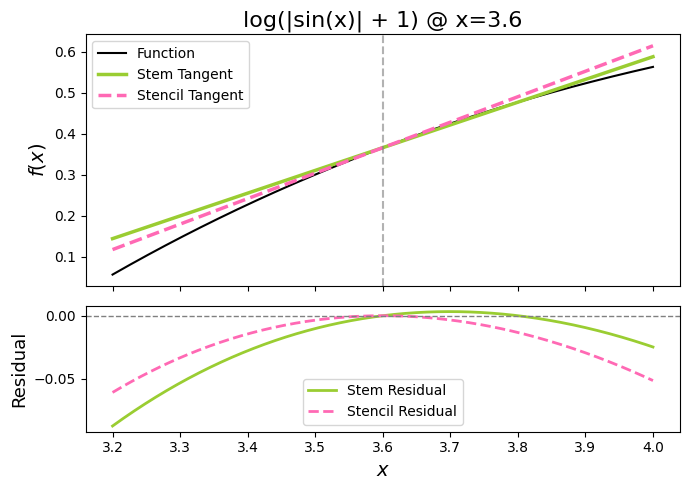

[stem_method] Component 0 did not converge, using fallback.


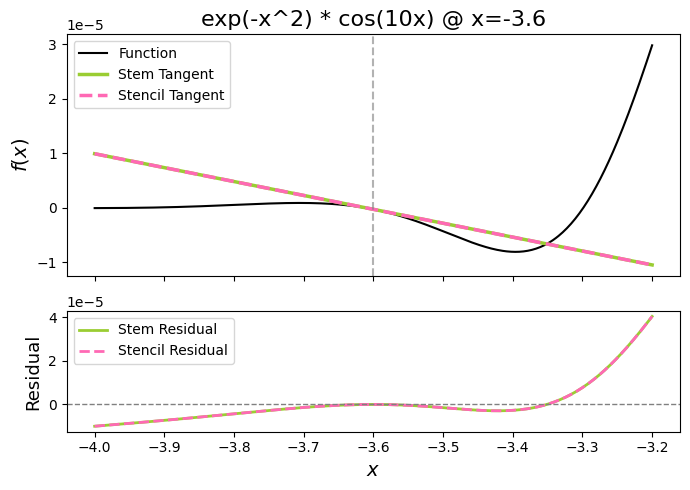

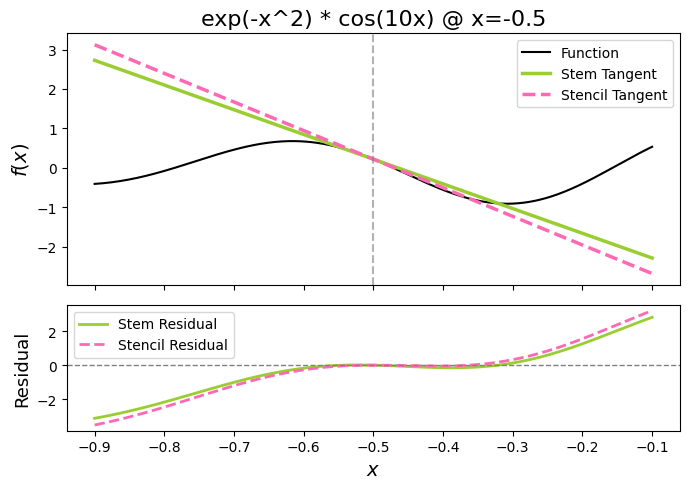

[stem_method] Component 0 did not converge, using fallback.


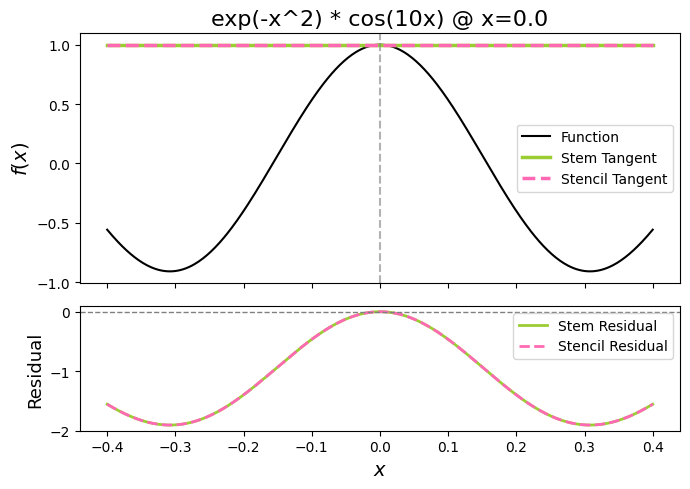

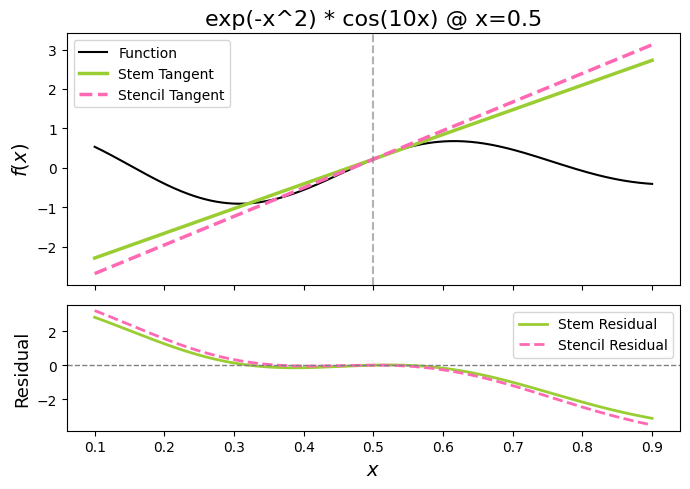

[stem_method] Component 0 did not converge, using fallback.


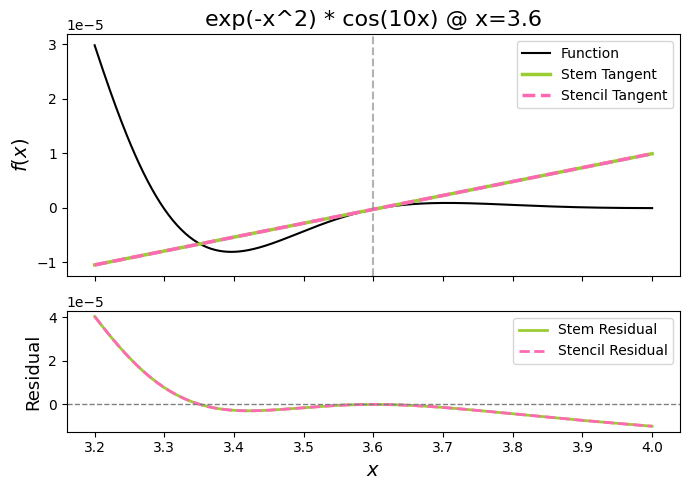

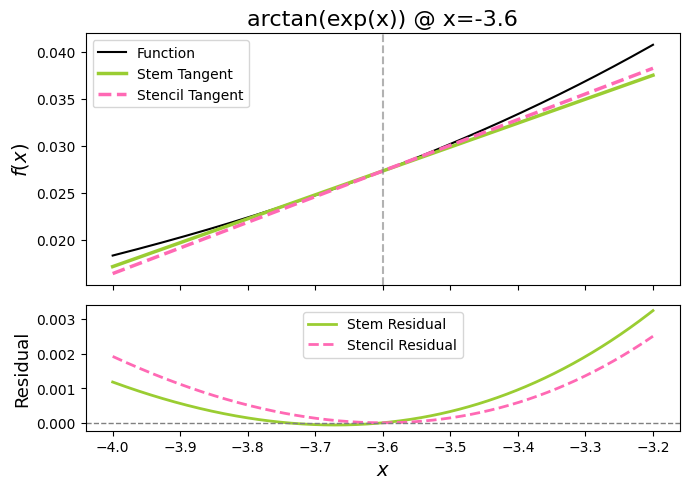

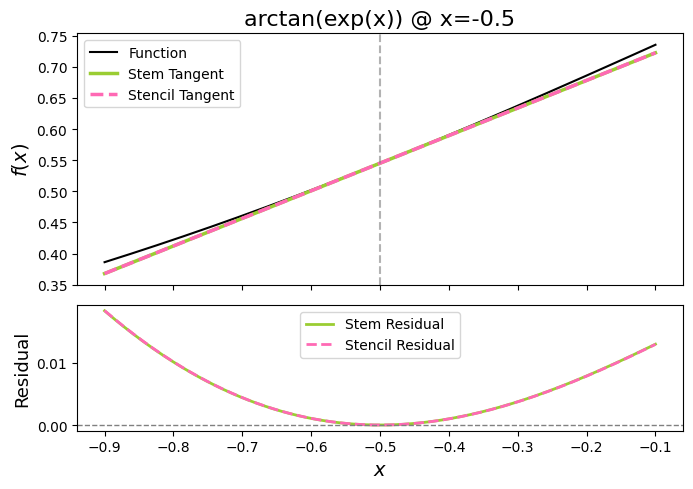

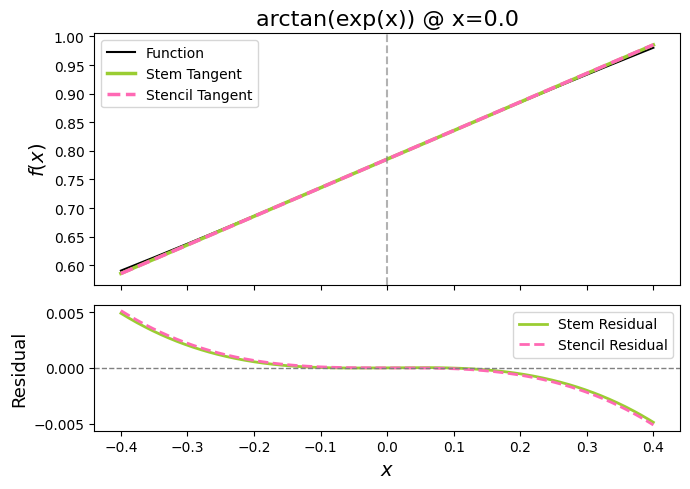

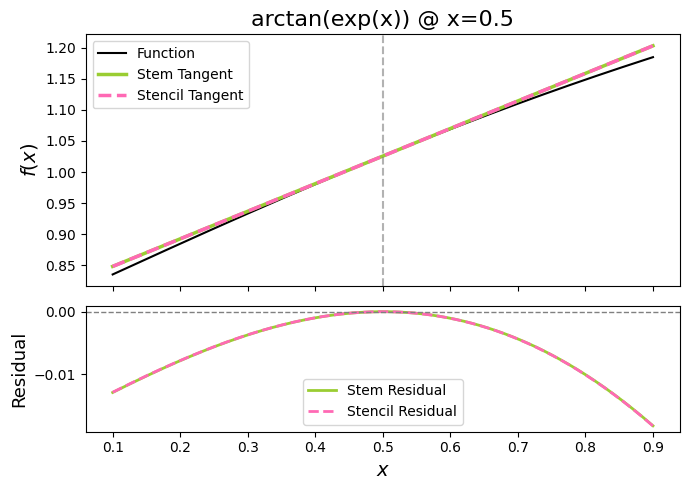

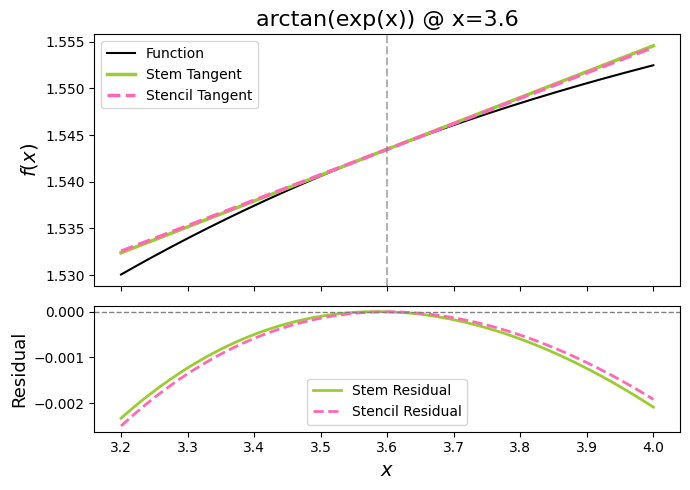

[stem_method] Component 0 did not converge, using fallback.


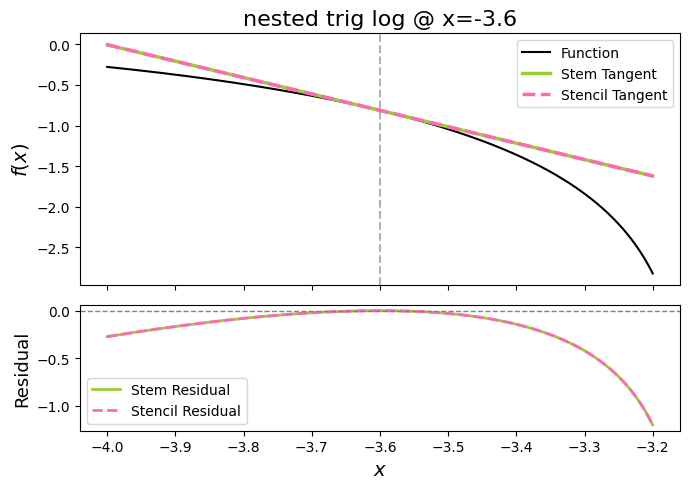

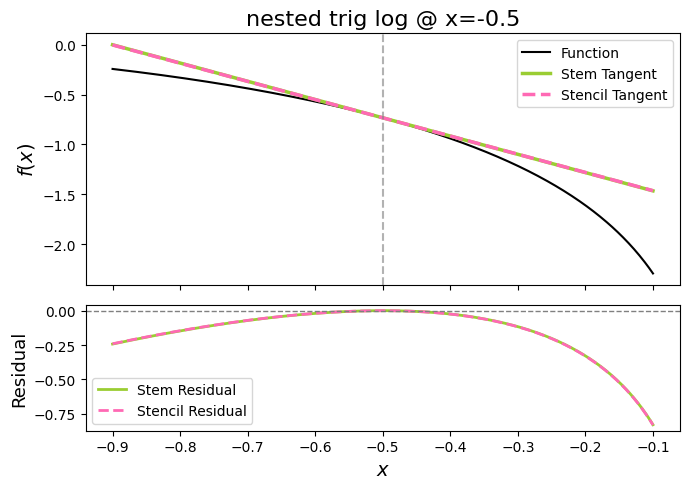

[stem_method] Function not smooth or differentiable at central_value; excluding 0% offset.
[stem_method] Component 0 did not converge, using fallback.


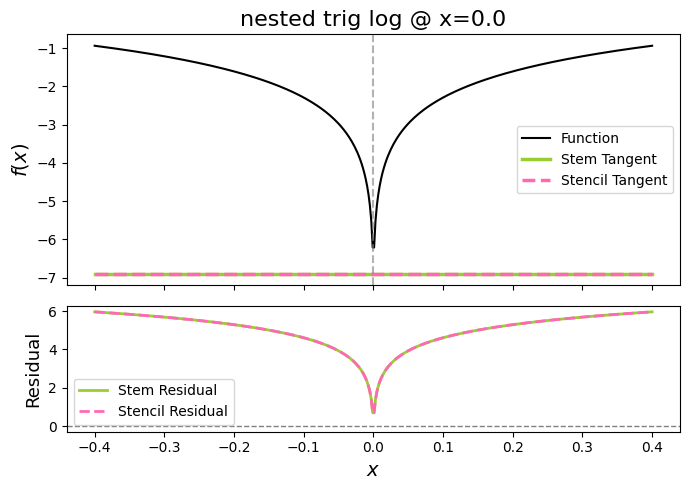

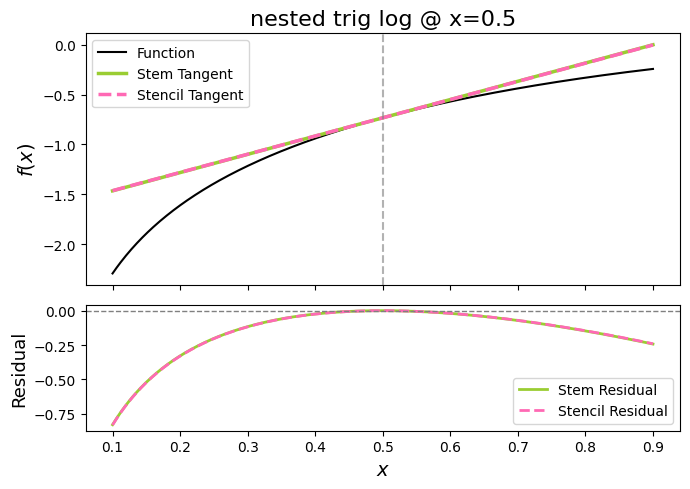

[stem_method] Component 0 did not converge, using fallback.


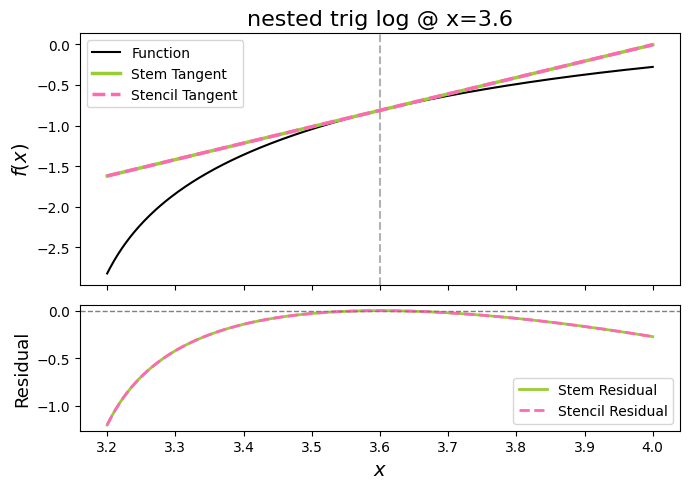

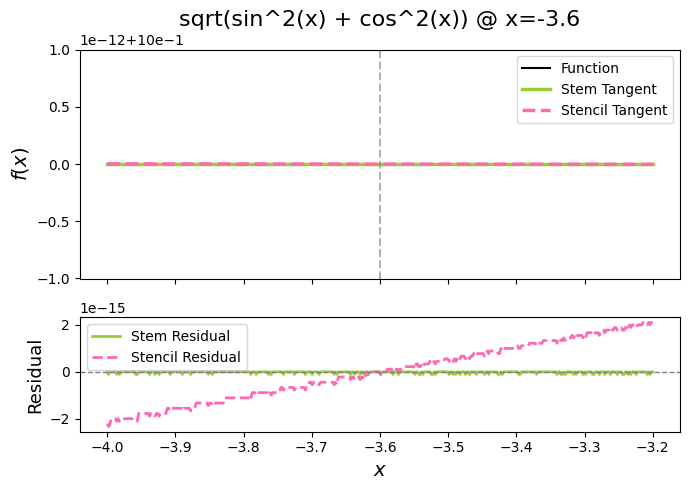

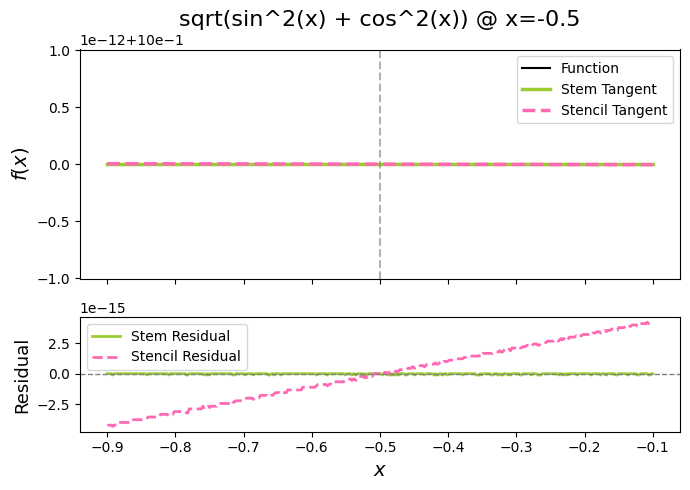

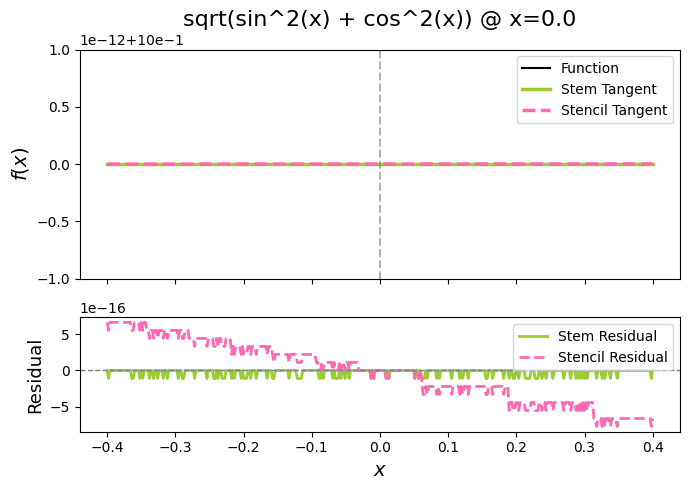

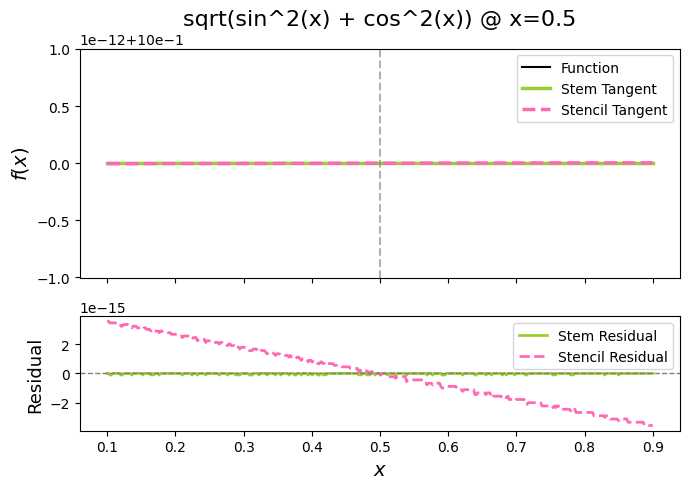

...

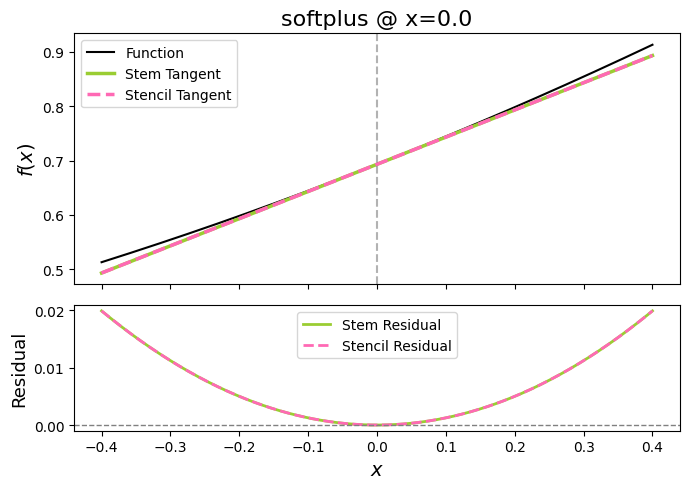

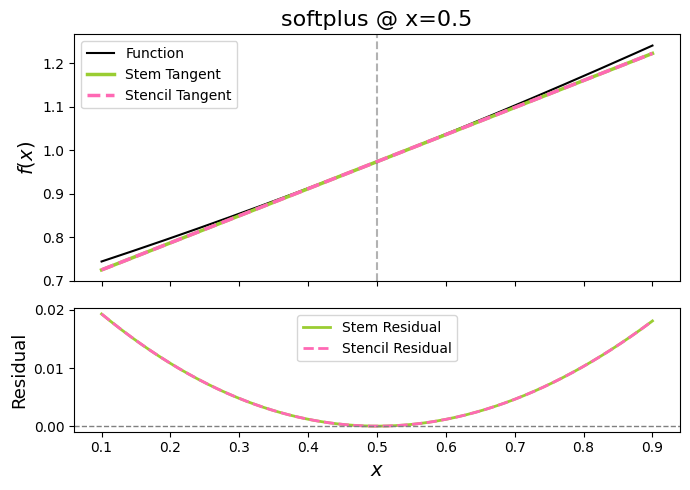

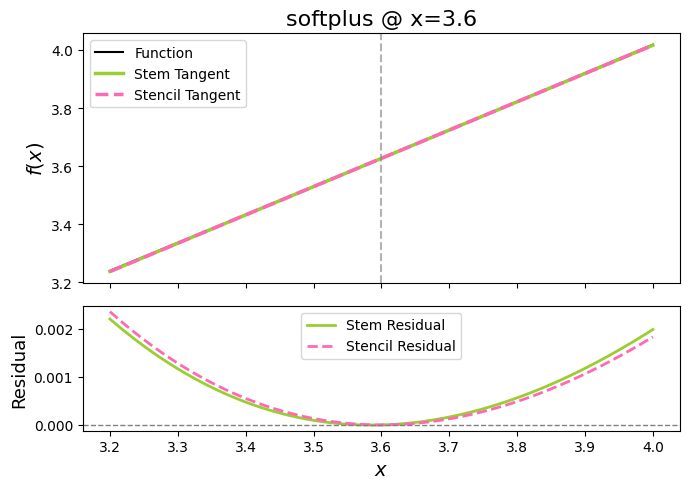

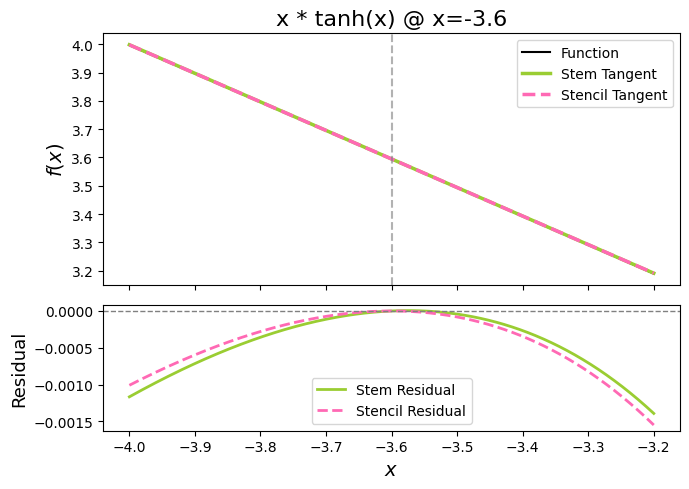

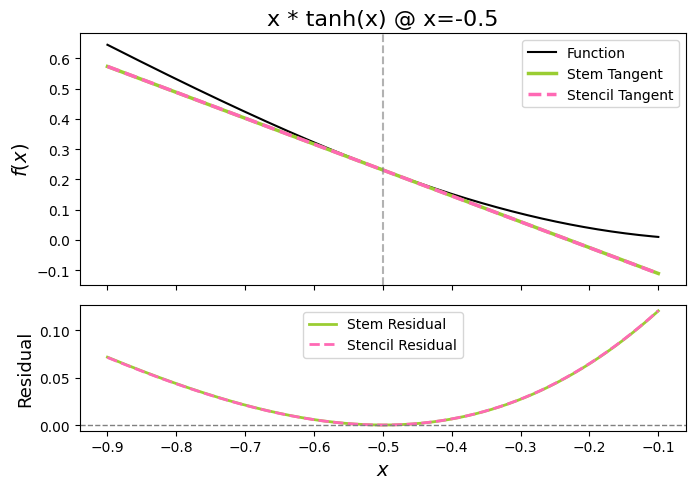

[stem_method] Component 0 did not converge, using fallback.


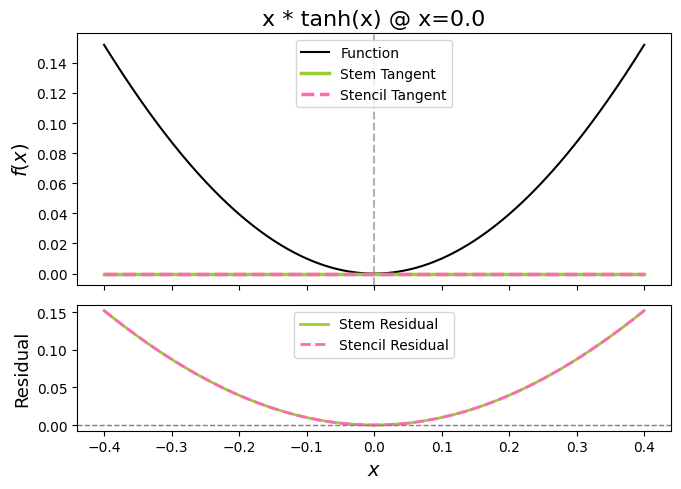

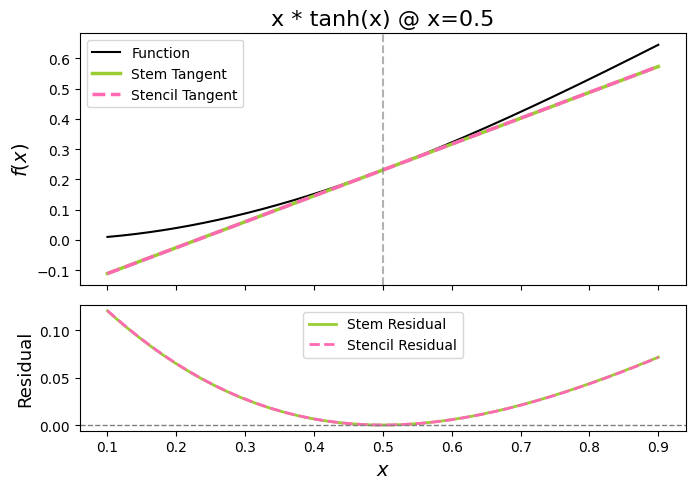

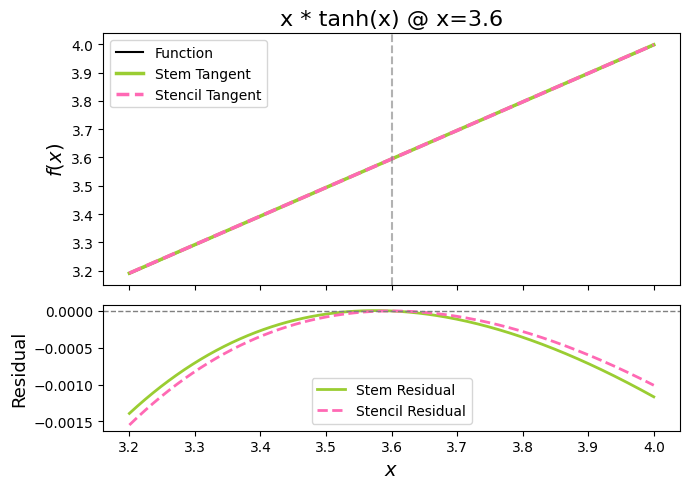

❌ Error for gaussian bump at x=-3.6: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
❌ Error for gaussian bump at x=-0.5: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
❌ Error for gaussian bump at x=0.0: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
❌ Error for gaussian bump at x=0.5: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
❌ Error for gaussian bump at x=3.6: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
❌ Error for x^x (safe) at x=-3.6: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
❌ Error for x^x (safe) at x=-0.5: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
[stem_method] Function not smooth or differentiable at central_value; excluding 0% offset.
[stem_method] C

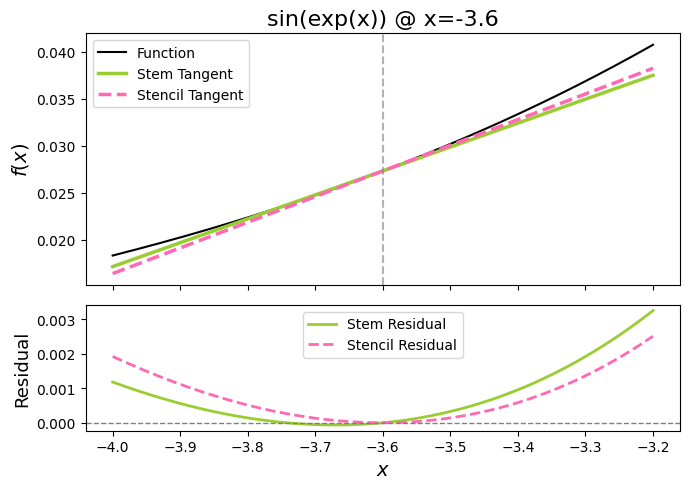

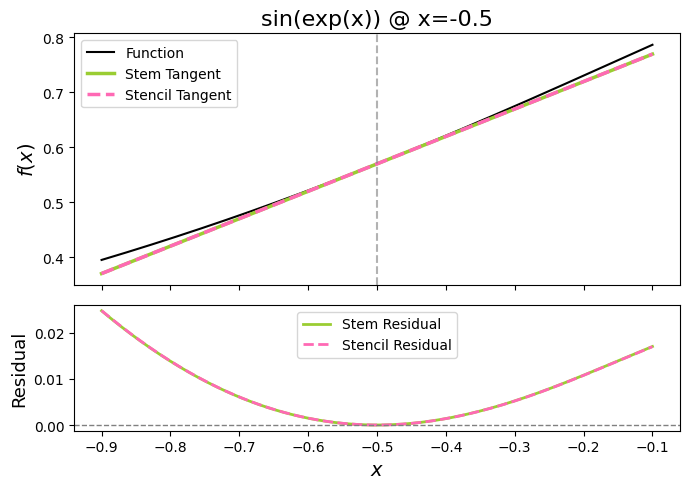

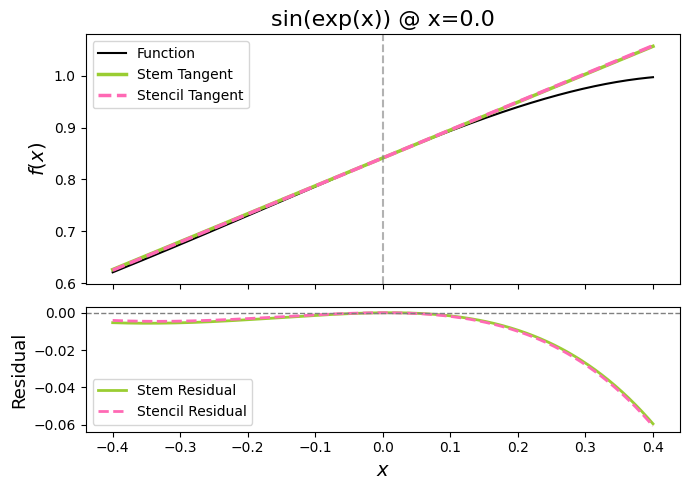

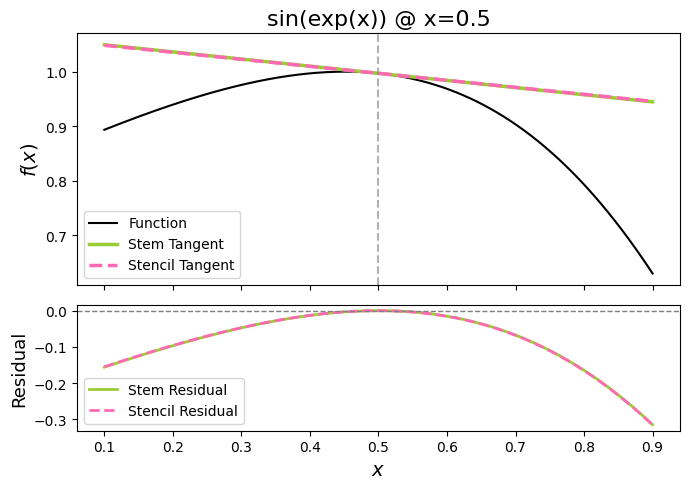

[stem_method] Function not smooth or differentiable at central_value; excluding 0% offset.
[stem_method] Component 0 did not converge, using fallback.


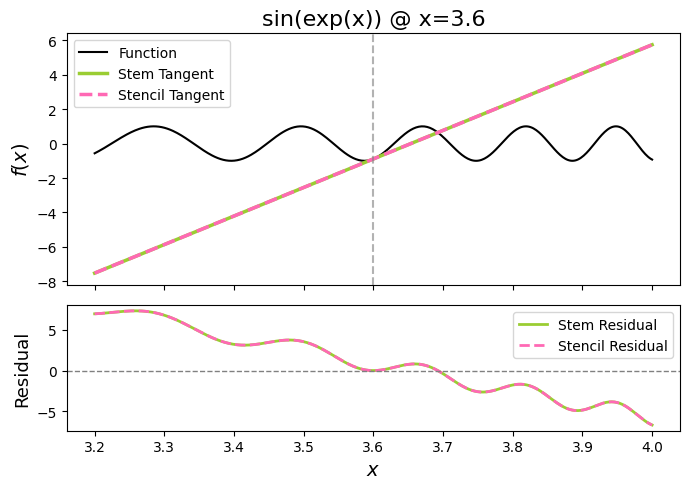

[stem_method] Component 0 did not converge, using fallback.


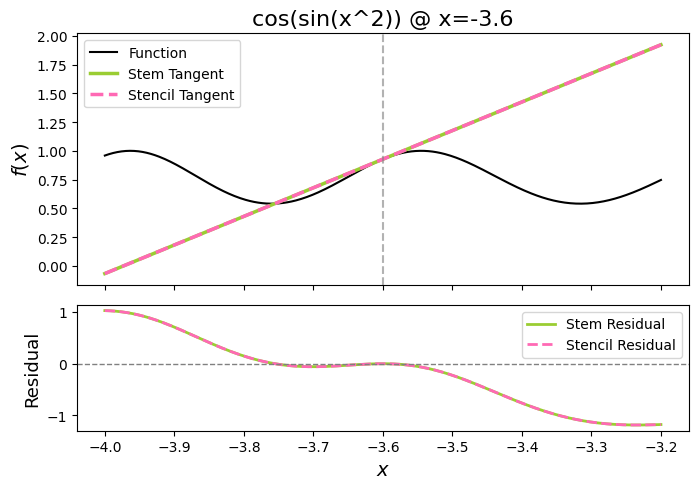

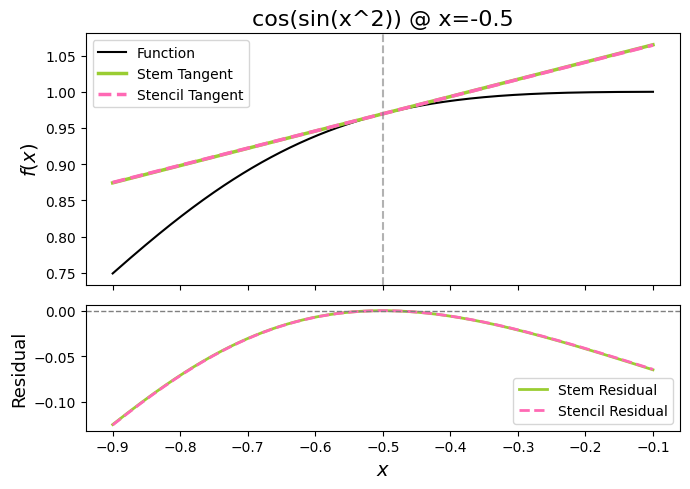

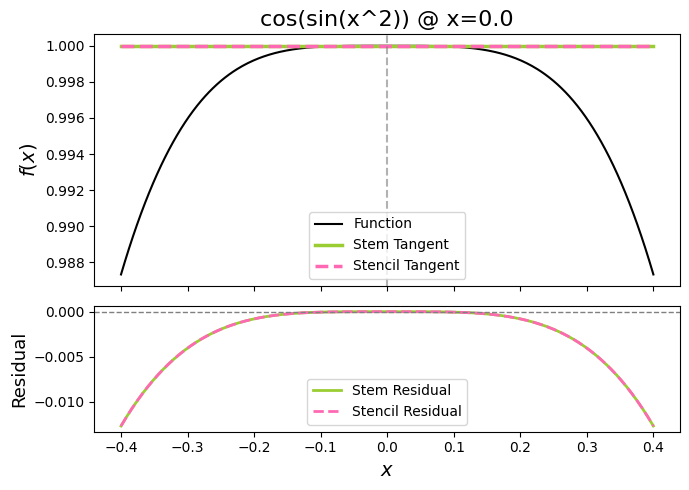

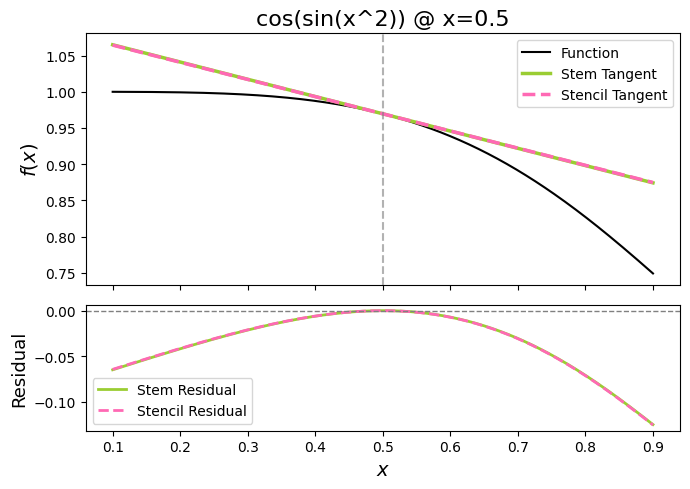

[stem_method] Component 0 did not converge, using fallback.


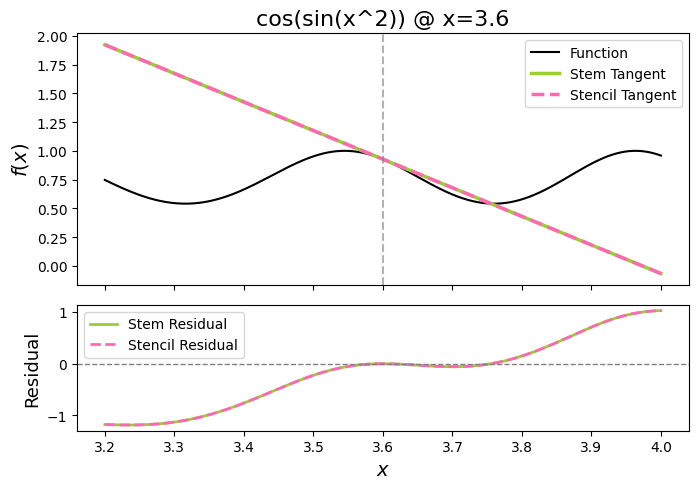

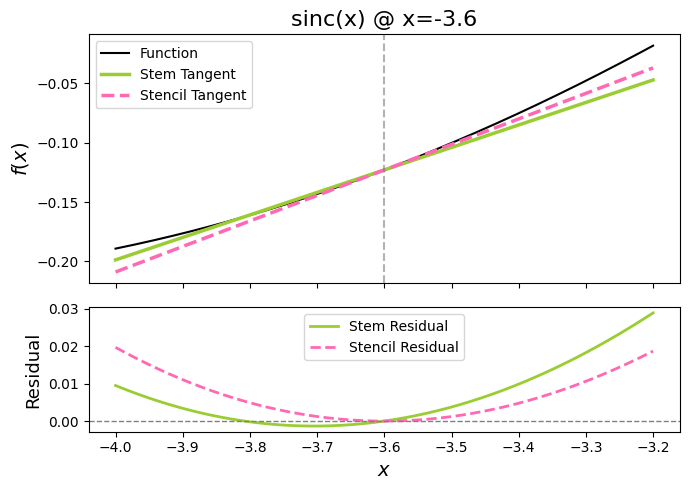

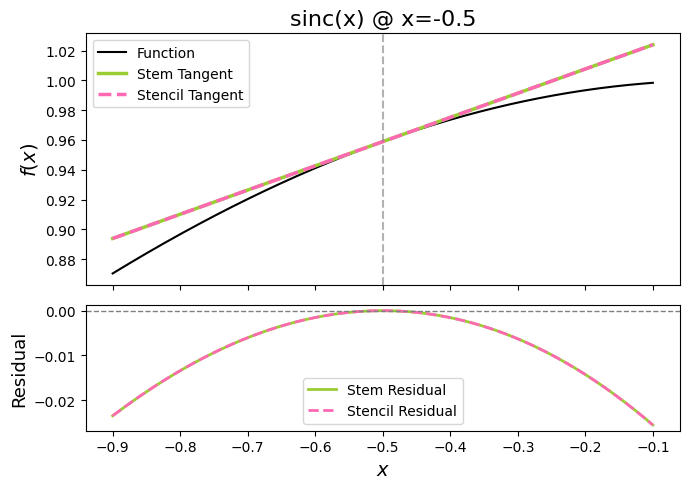

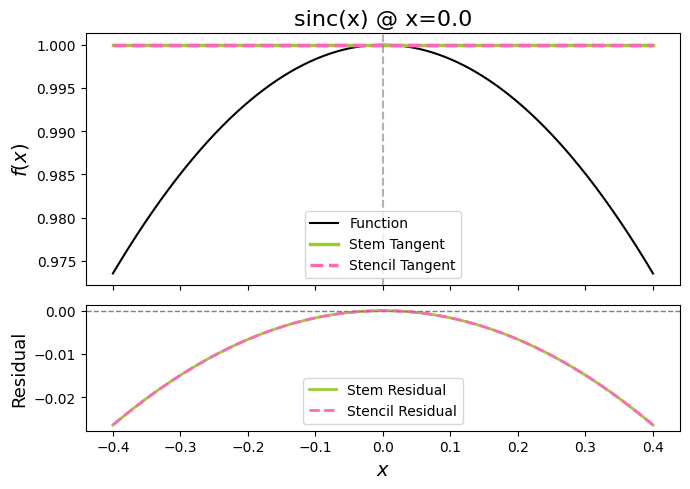

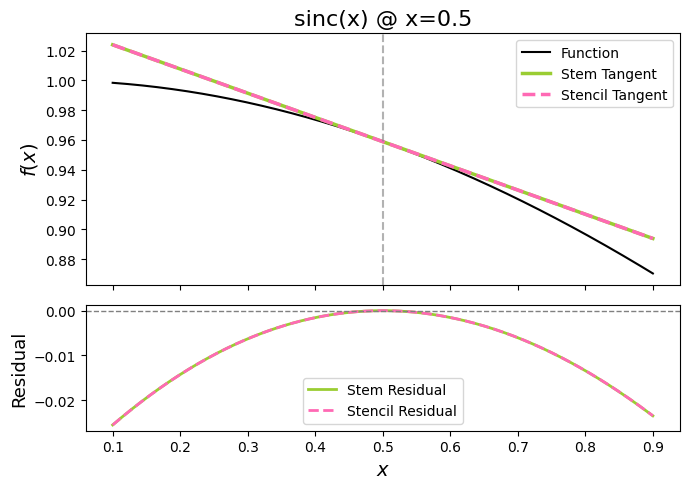

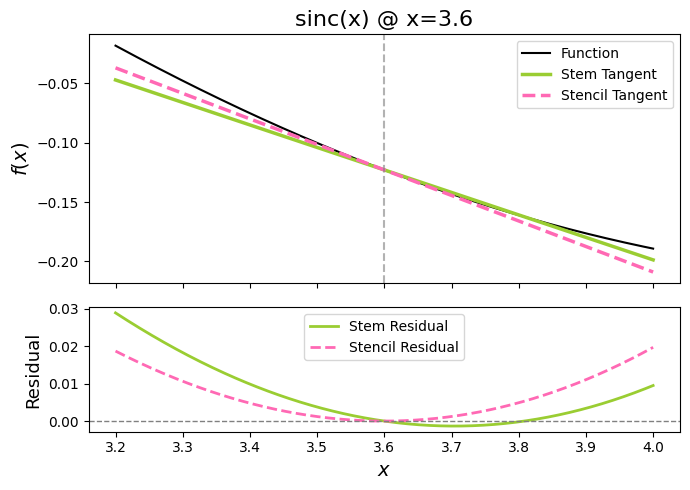

CPU times: user 1min 55s, sys: 23.6 s, total: 2min 18s
Wall time: 1min


In [8]:
%%time
func_dict = {entry["name"]: entry["func"] for entry in test_functions}
x_center_list = [-3.6, -0.5, 0.0, 0.5, 3.6]

plot_all_derivatives(func_dict, x_center_list)
